In [5]:
from astroquery.sdss import SDSS
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
import math
import numpy as np
from specutils import Spectrum
from specutils.fitting import fit_generic_continuum
from specutils.manipulation import LinearInterpolatedResampler
from labellines import labelLines
import matplotlib.axes as axes
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
import scipy
from PIL import Image
from fpdf import FPDF
import random

In [6]:
eboss_fits = fits.open('eboss_dr17_summary_edapv10_cigale.fit', memmap=True)

eboss_data = eboss_fits[1].data
eboss_fits.info()
print(eboss_fits[1].columns)

Filename: eboss_dr17_summary_edapv10_cigale.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU    235   1898753R x 109C   ['J', 'J', 'J', '16A', 'D', 'E', 'D', 'D', 'E', '118A', '4A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '9A', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', 'E', '8E', '8E', '8E', '8E', '5E', '5E', '5E', '5E', 'E', 'E', 'A', 'A', 'A', 'I', 'I', 'I']   
ColDefs(
    name = 'PLATE'; format = 'J'
    name = 'MJD'; format = 'J'
    name = 'FIBER'; format = 'J'
    name = 'PMF_STRING'; format = '16A'
    name = 'Z'; format = 'D'
    name = 'Z_ERR'; format = 'E'
    nam

In [7]:
# Remove possible +/- inf values
gals_flux = eboss_data[(eboss_data['NII_6584_FLUX_ERR']>0)]

err_range = 3

# Make sure relavent emission lines have well measured fluxes
quality_gals = gals_flux[((gals_flux['H_ALPHA_FLUX']/gals_flux['H_ALPHA_FLUX_ERR'])>err_range) &
                (((gals_flux['NII_6584_FLUX']/gals_flux['NII_6584_FLUX_ERR'])>err_range) | (gals_flux["H_GAMMA_EW"]>10)) & 
                (gals_flux['Z']<0.15)] #signal to noise ratio filter

cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]

print(len(cut_gals))

gals_sf = cut_gals[cut_gals['SFG']==1]
gals_agn = cut_gals[cut_gals['AGN']==1]

1286


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\3052148939.py:11: RuntimeWarning: divide by zero encountered in log10
  cut_gals = quality_gals[(np.log10(quality_gals['NII_6584_FLUX']/quality_gals['H_ALPHA_FLUX'])<(-1.5))]


In [11]:
random_galaxies = random.sample(range(1, len(cut_gals)), 100)
random_galaxies.sort()
print(random_galaxies)
random_galaxies = [4, 8, 15, 18, 23, 32, 34, 51, 55, 62, 70, 71, 72, 91, 95, 100, 115, 121, 127, 137, 153, 158, 168, 175, 183, 219, 220, 224, 230, 234, 241, 257, 265, 271, 274, 277, 283, 287, 313, 336, 342, 384, 430, 442, 500, 502, 505, 511, 521, 533, 534, 550, 565, 566, 567, 568, 571, 611, 618, 656, 662, 667, 673, 710, 711, 750, 764, 772, 791, 796, 808, 819, 824, 837, 838, 843, 852, 854, 861, 862, 869, 875, 876, 913, 919, 922, 924, 970, 976, 987, 990, 1037, 1104, 1177, 1201, 1207, 1221, 1226, 1234, 1258]

[13, 32, 33, 37, 55, 58, 63, 68, 100, 139, 147, 150, 189, 194, 238, 290, 293, 302, 309, 316, 326, 382, 395, 403, 413, 423, 432, 453, 458, 463, 478, 484, 488, 493, 500, 519, 528, 529, 538, 554, 566, 567, 570, 575, 593, 596, 625, 639, 649, 693, 694, 708, 721, 743, 745, 755, 756, 766, 767, 769, 780, 781, 792, 794, 810, 815, 818, 822, 850, 852, 866, 885, 893, 897, 916, 934, 940, 949, 960, 964, 971, 972, 978, 1029, 1037, 1060, 1061, 1074, 1086, 1089, 1092, 1109, 1125, 1146, 1171, 1176, 1177, 1193, 1245, 1280]


In [13]:
def hex_to_rgb(hex_color):
    """Converts a hex color code to an RGB tuple.

    Args:
        hex_color: A string representing the hex color code (e.g., "#FF0000").

    Returns:
        A tuple of three integers representing the RGB values (e.g., (255, 0, 0)).
    """
    hex_color = hex_color.lstrip("#")  # Remove the '#' if present
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

def get_color_gradient(c1, c2, n):
    """
    Given two hex colors, returns a color gradient
    with n colors.
    """
    assert n > 1
    c1_rgb = np.array(hex_to_rgb(c1))/255
    c2_rgb = np.array(hex_to_rgb(c2))/255
    mix_pcts = [x/(n-1) for x in range(n)]
    rgb_colors = [((1-mix)*c1_rgb + (mix*c2_rgb)) for mix in mix_pcts]
    return ["#" + "".join([format(int(round(val*255)), "02x") for val in item]) for item in rgb_colors]

0
3615-56544-100
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


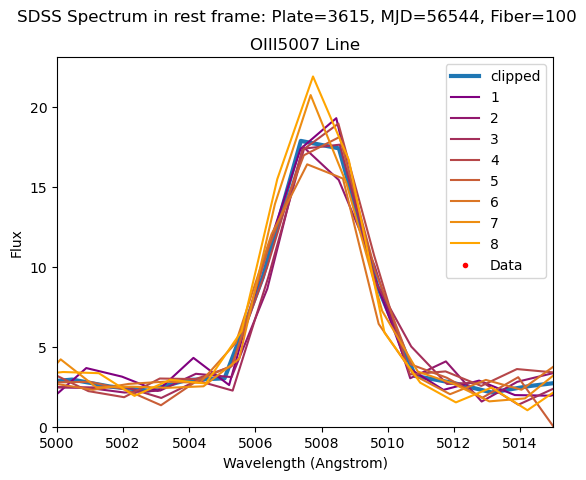

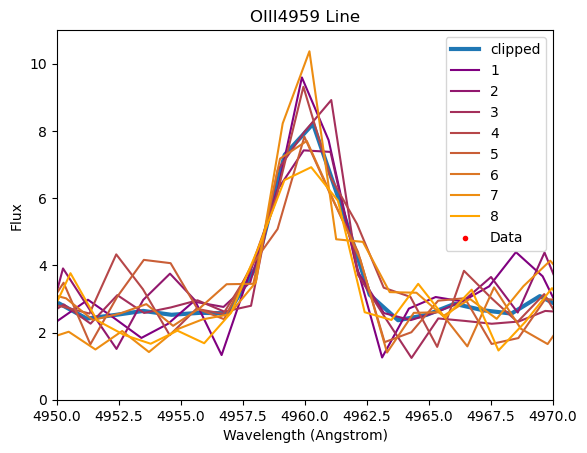

1
3657-55244-4
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


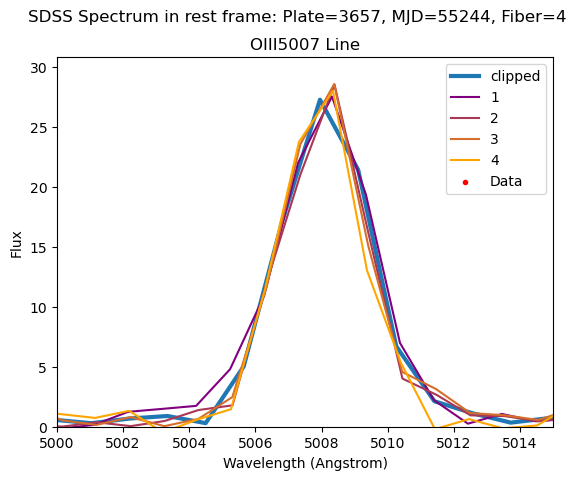

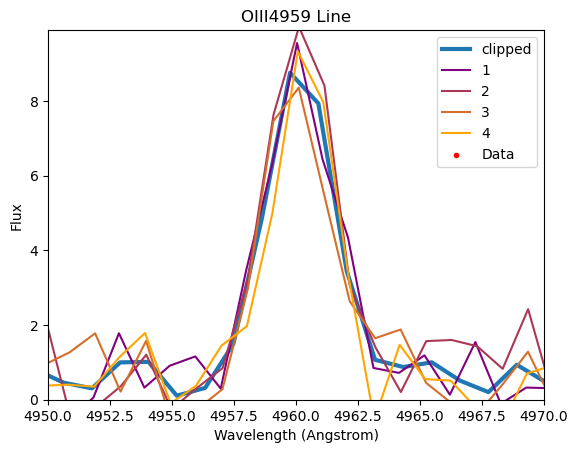

2
3670-55480-196
[1761, 1762, 1763]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


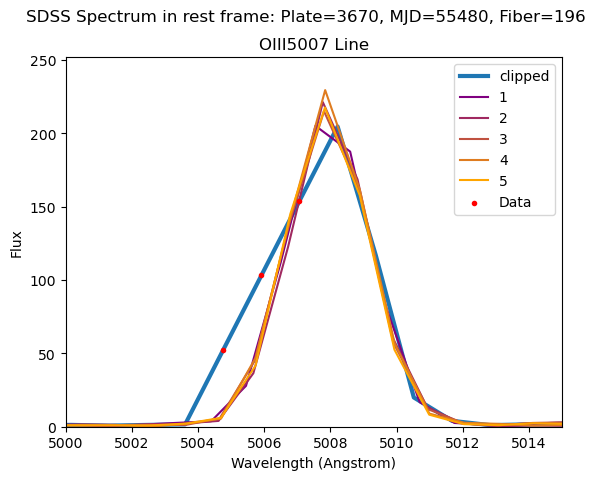

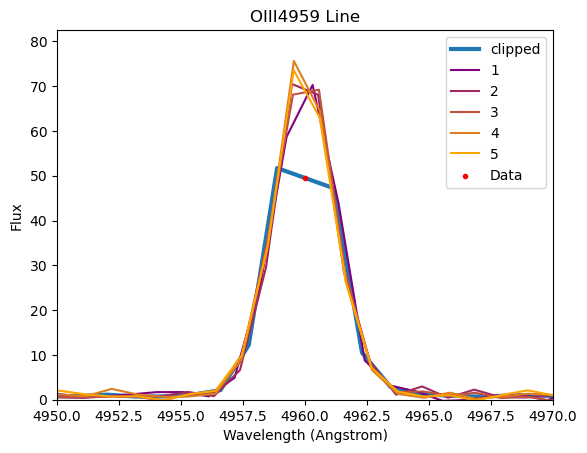

3
3691-55274-169
[1821, 1822, 1823, 1824, 1825, 1826, 1827, 1828, 1829]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


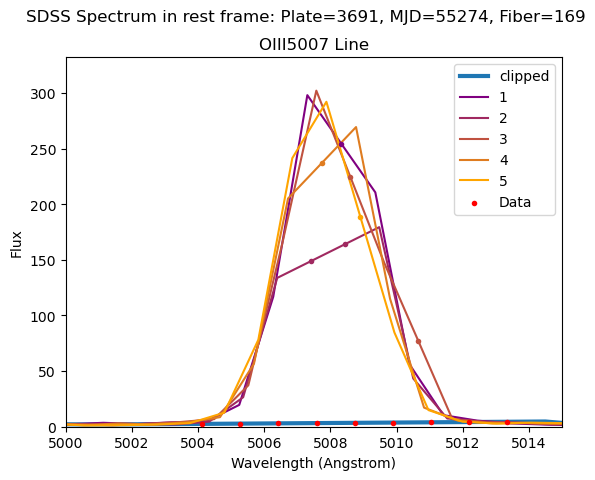

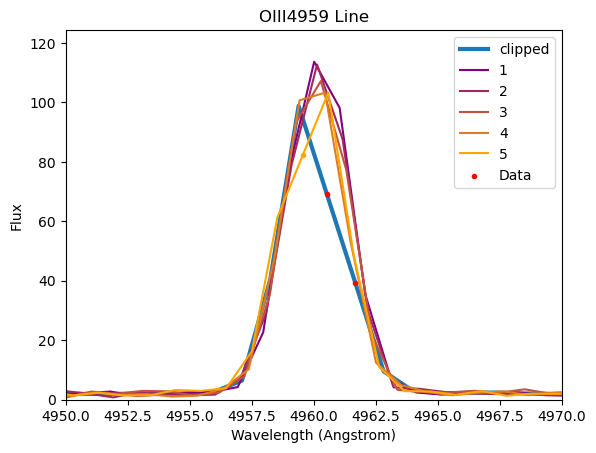

4
3744-55209-368
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


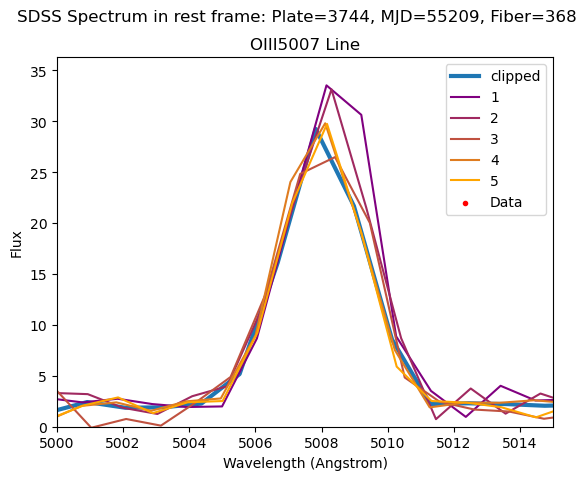

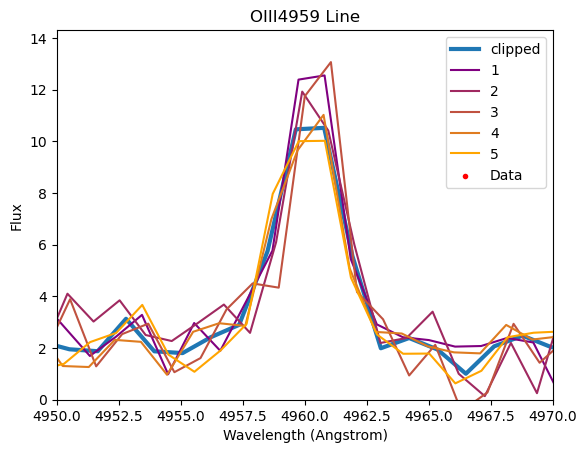

5
3771-55544-642
[1662, 1663, 1664, 1665, 1666]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


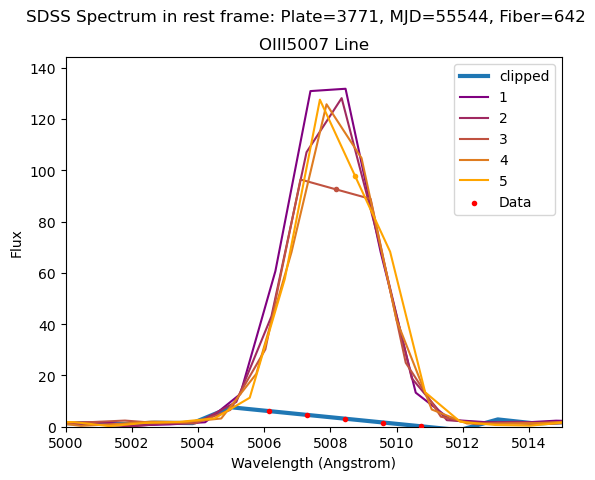

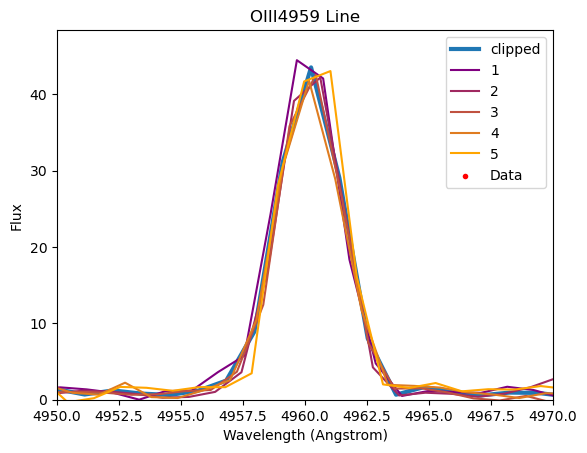

6
3772-55277-36
[1906]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


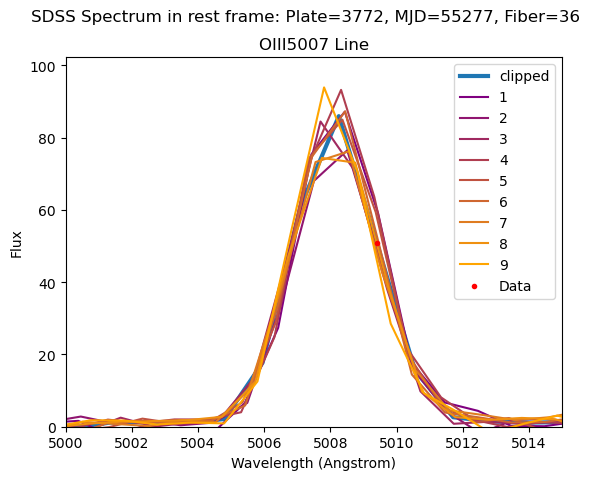

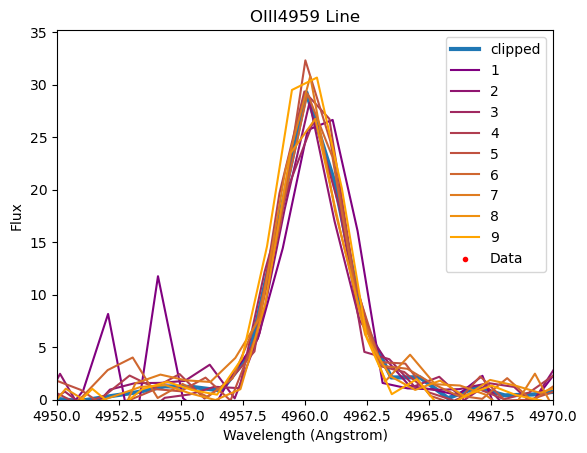

7
3837-55572-639
[1864, 1865, 1866]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


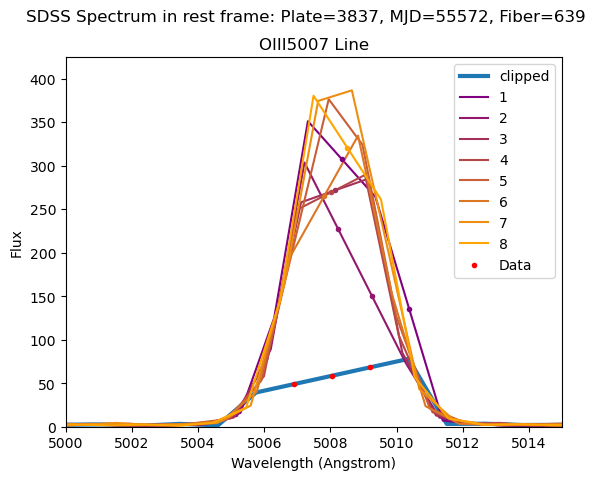

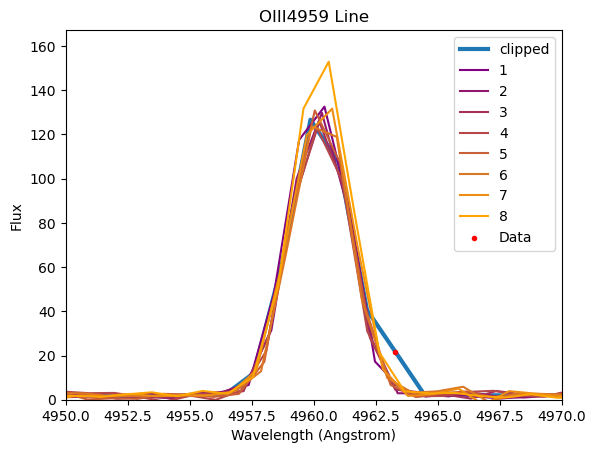

8
3854-55247-366
[1712]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


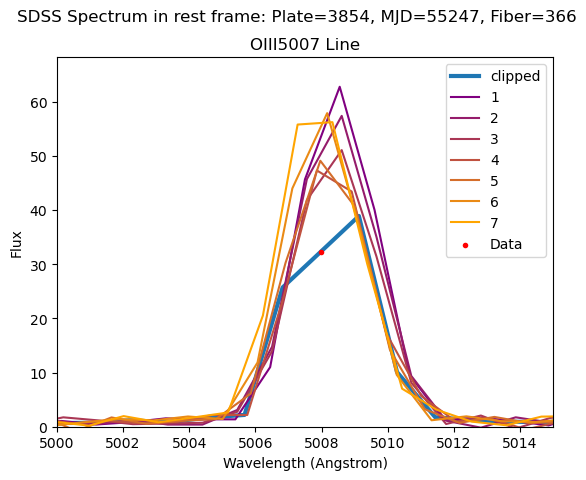

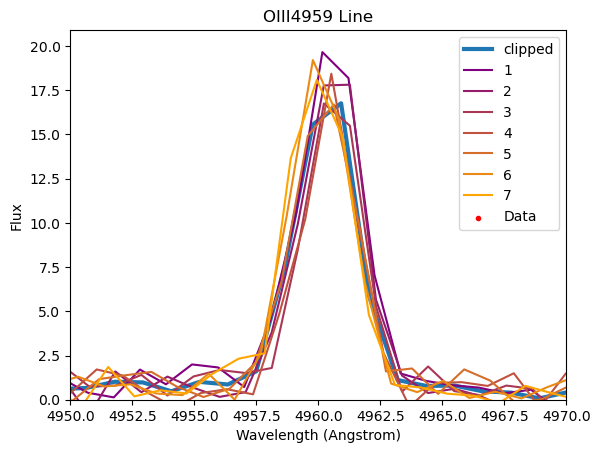

9
3874-55280-437
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


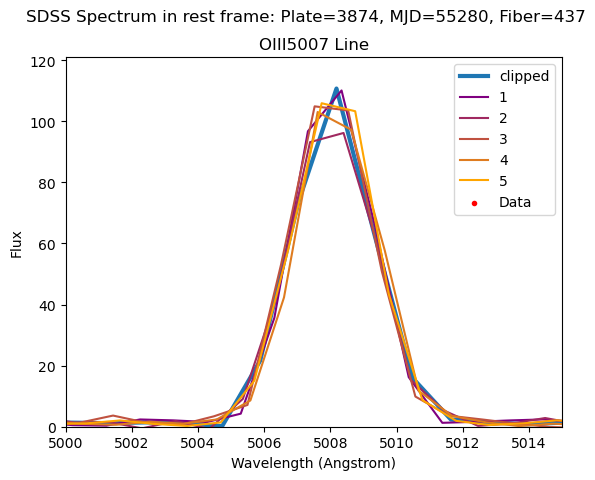

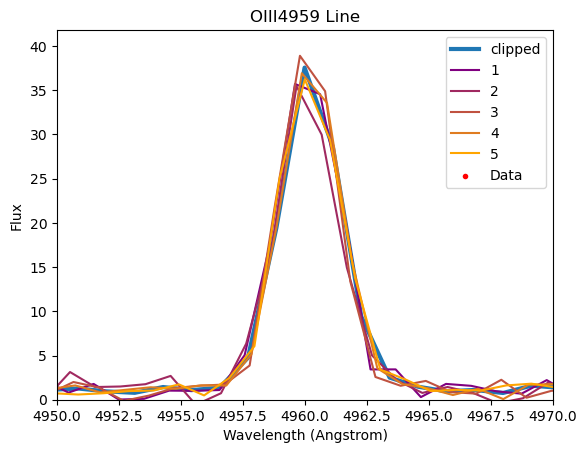

10
3951-55681-136
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


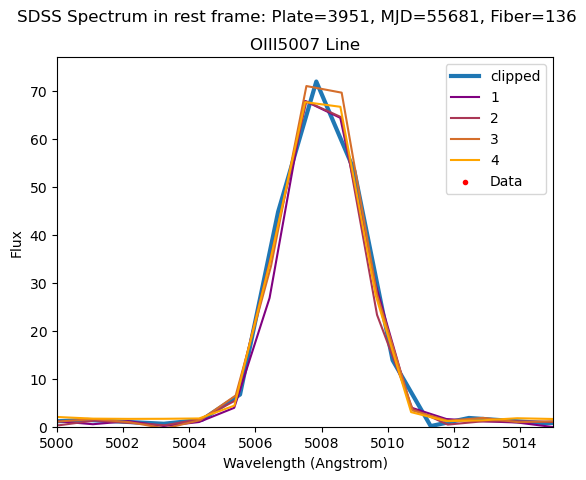

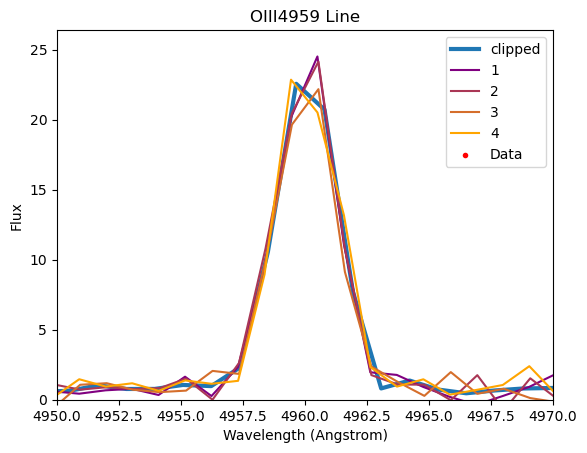

11
3954-55680-189
[1736, 1737, 1738, 1740, 1741, 1742, 1743]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


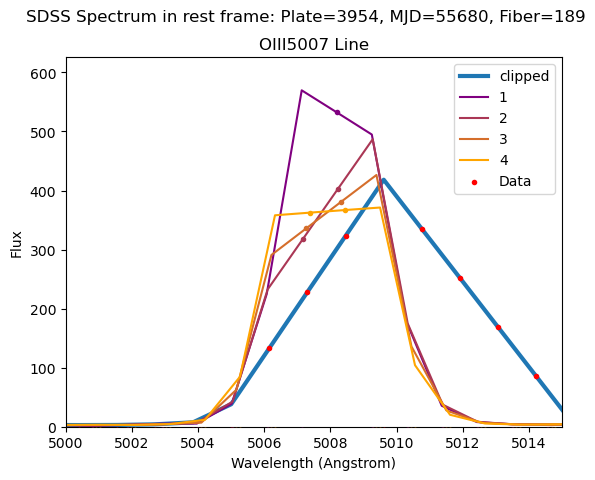

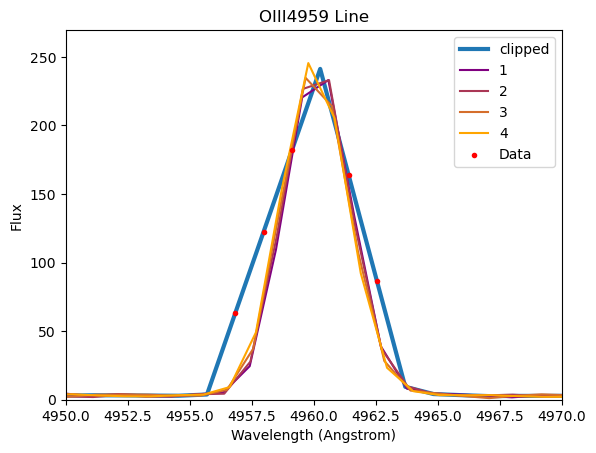

12
3954-55680-268
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


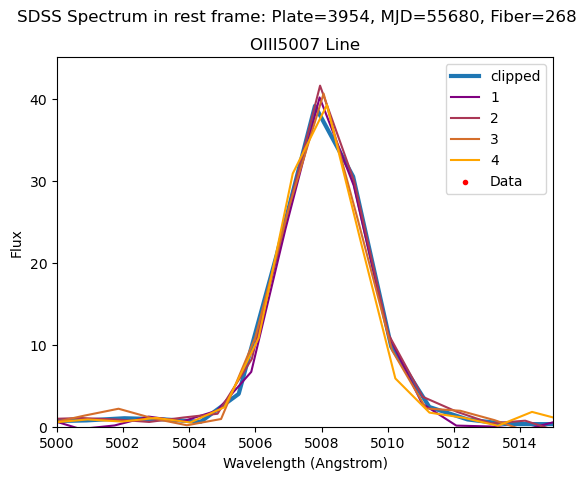

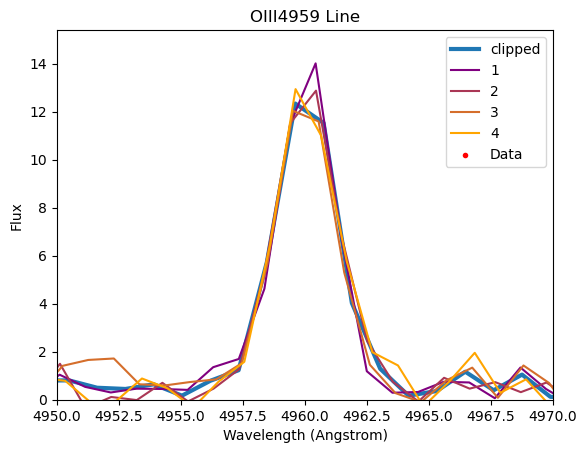

13
4092-55477-446
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


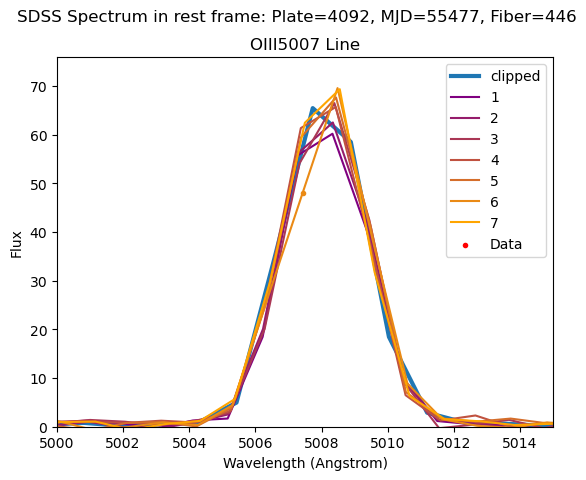

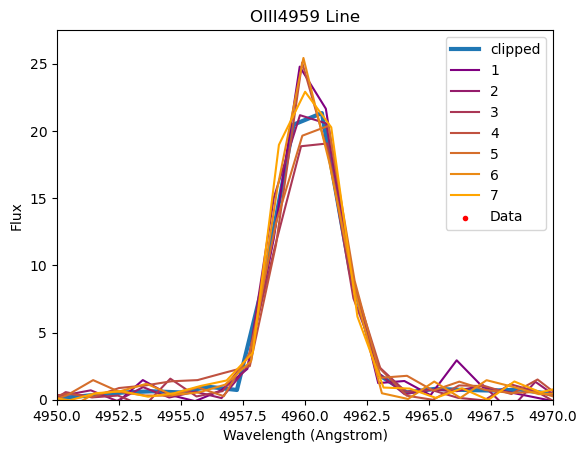

14
4174-55659-410
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


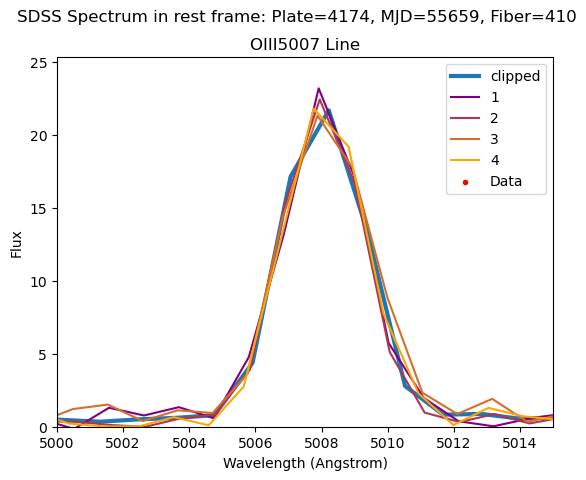

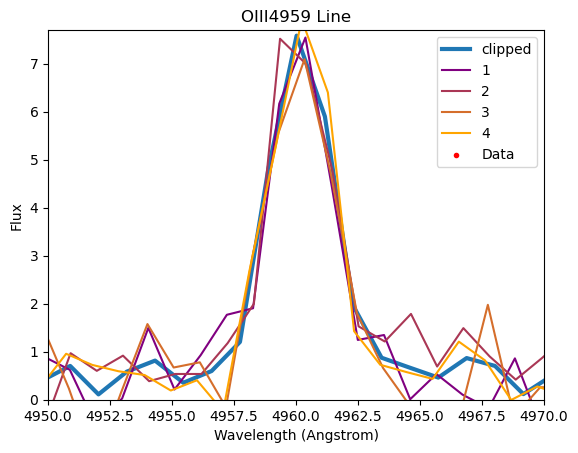

15
4182-55446-204
[1513]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


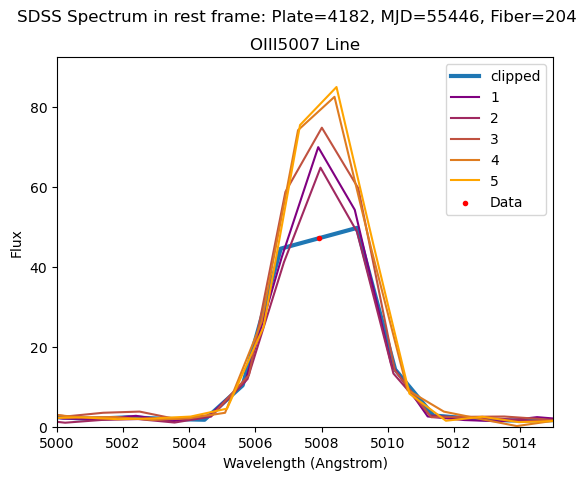

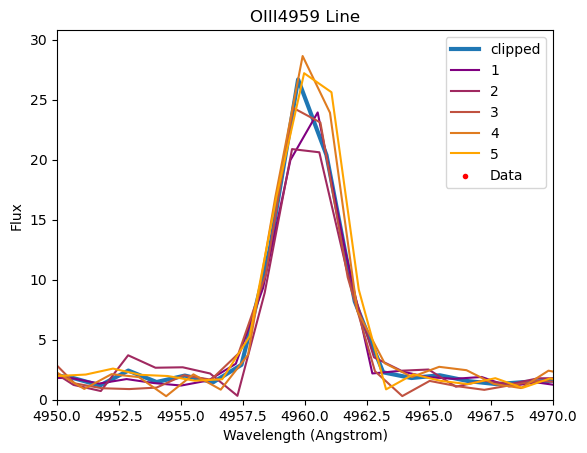

16
4228-55484-840
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


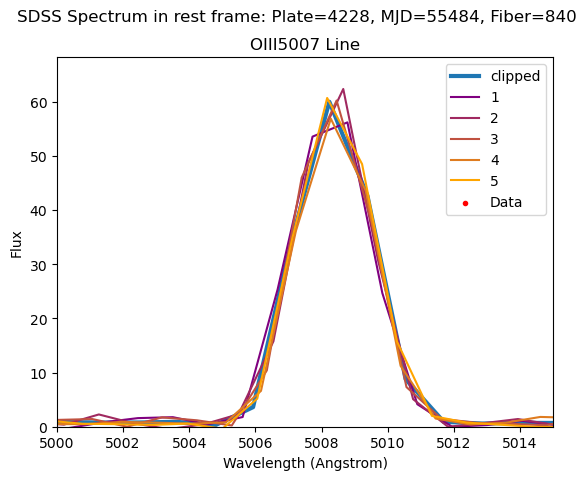

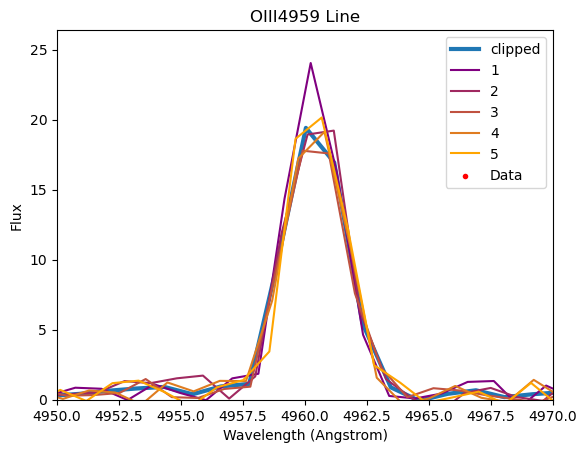

17
4256-55477-284
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


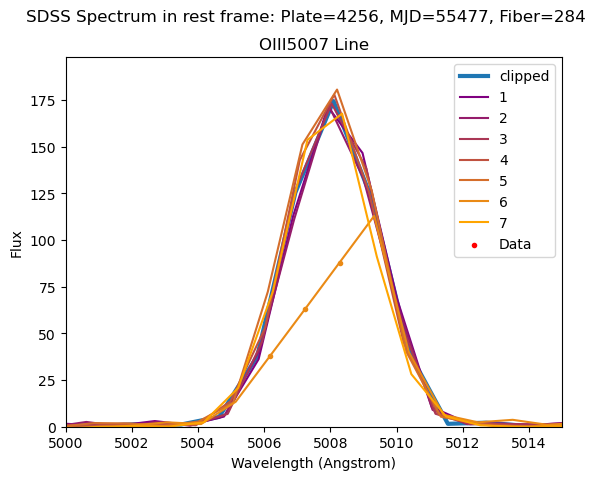

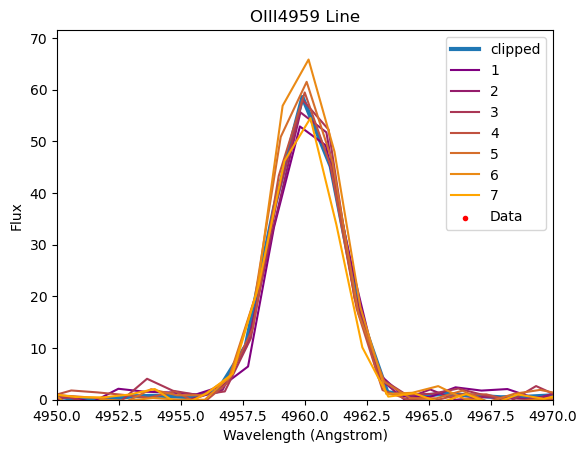

18
4269-55502-464
[1786]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


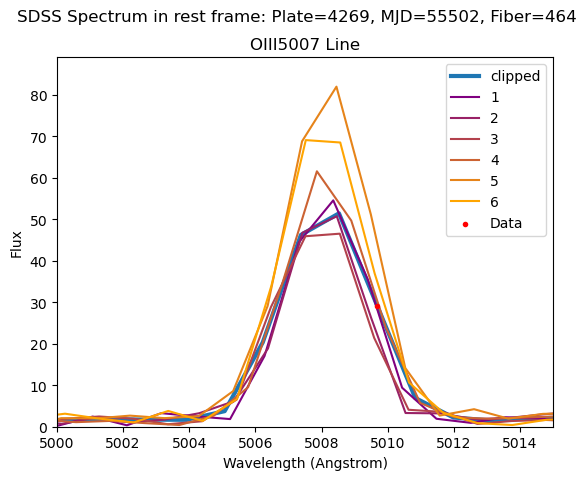

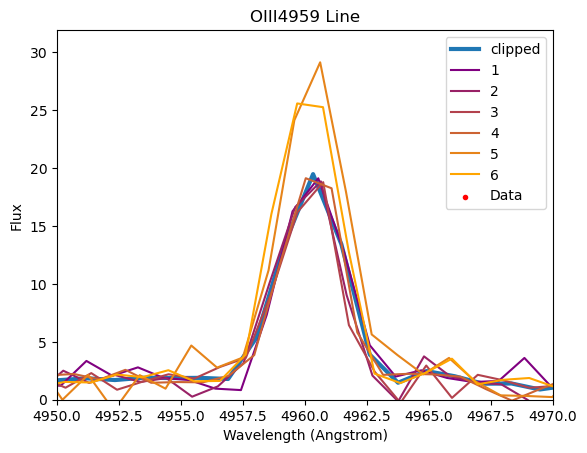

19
4297-55806-323
[1750, 1752, 1753, 1754, 1755, 1756, 1757, 1758]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


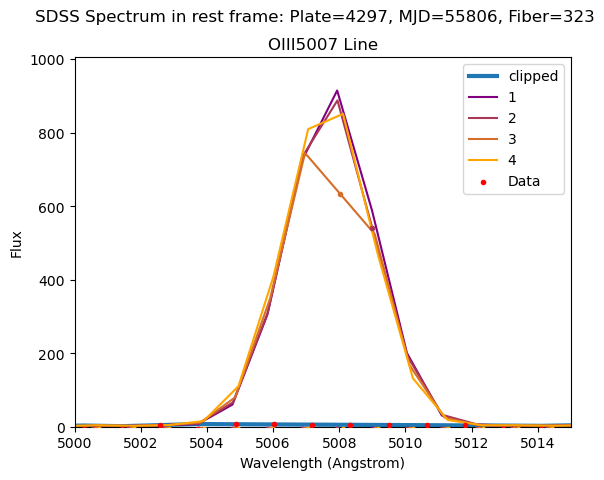

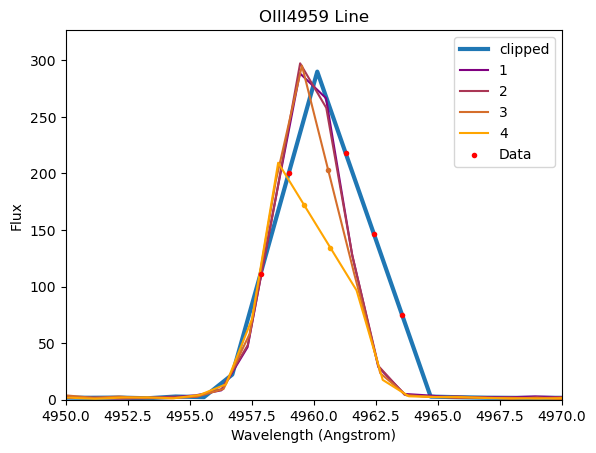

20
4382-55742-798
[1665, 1666]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


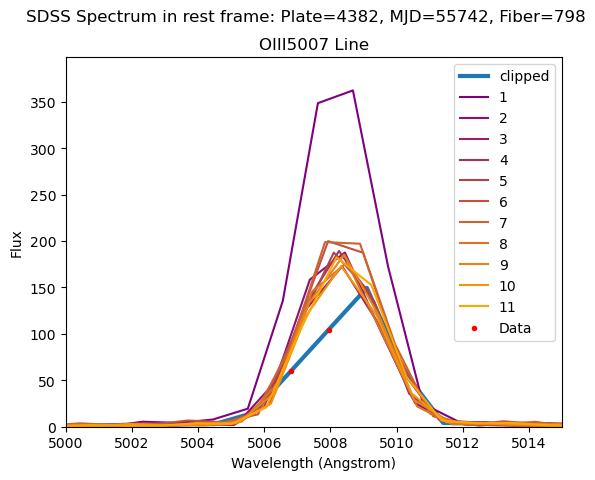

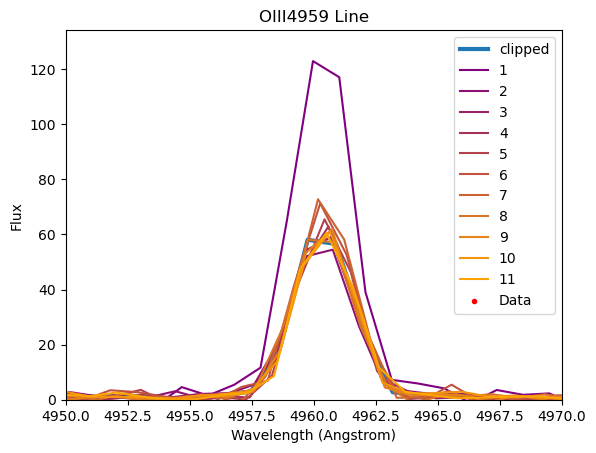

21
4391-55866-290
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


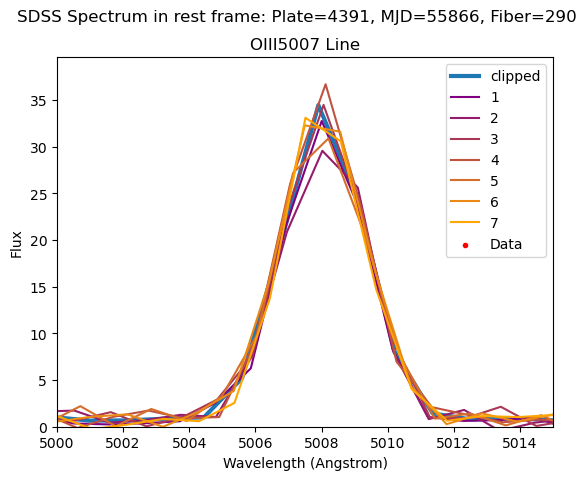

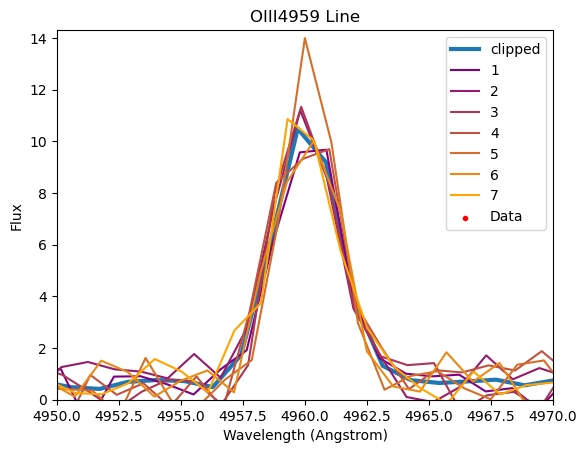

22
4412-55912-317
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


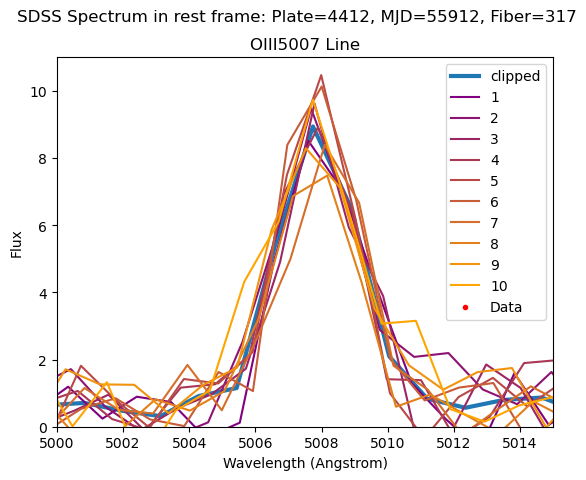

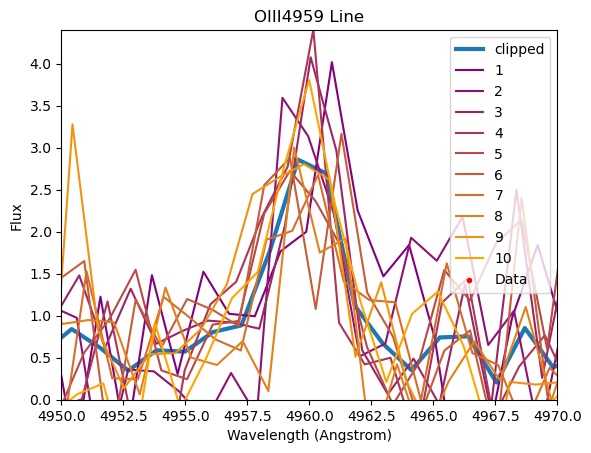

23
4445-55622-812
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


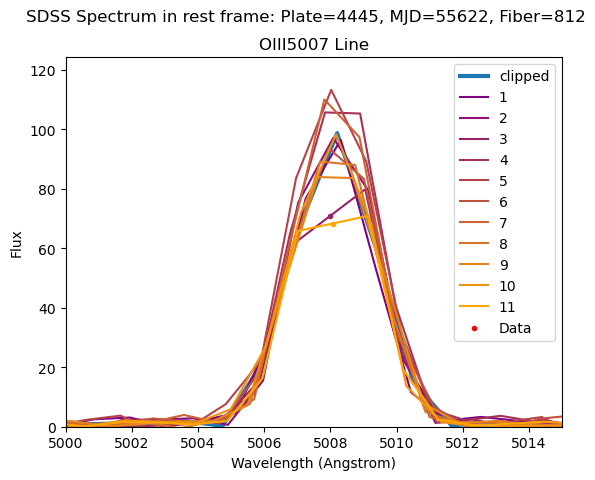

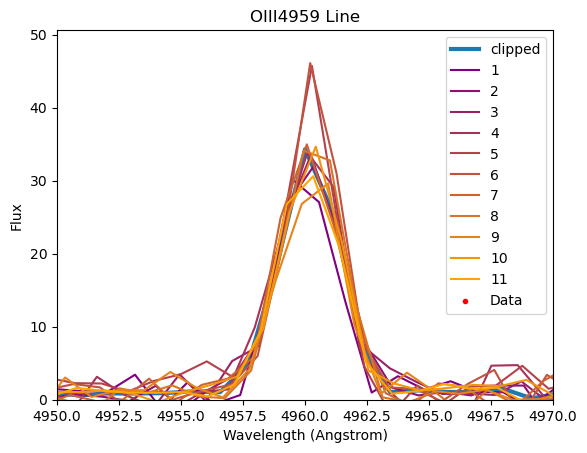

24
4456-55537-872
[1833, 1835, 1836]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


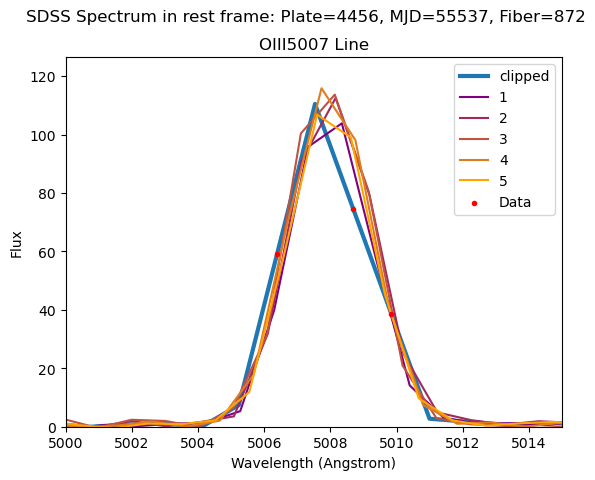

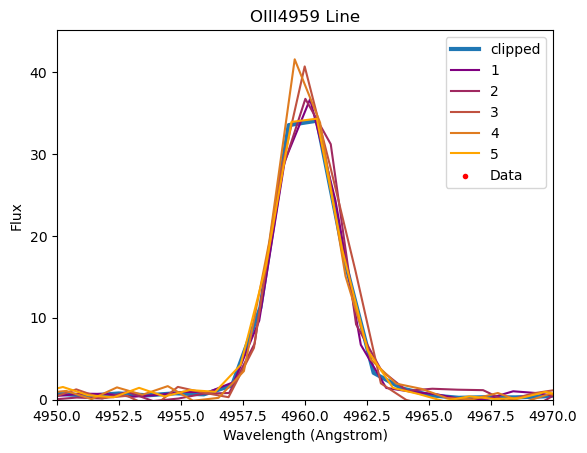

25
4612-55590-111
[1724, 1725, 1726]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


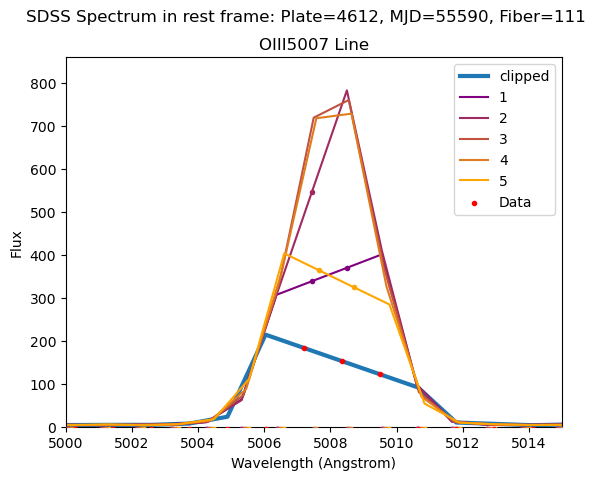

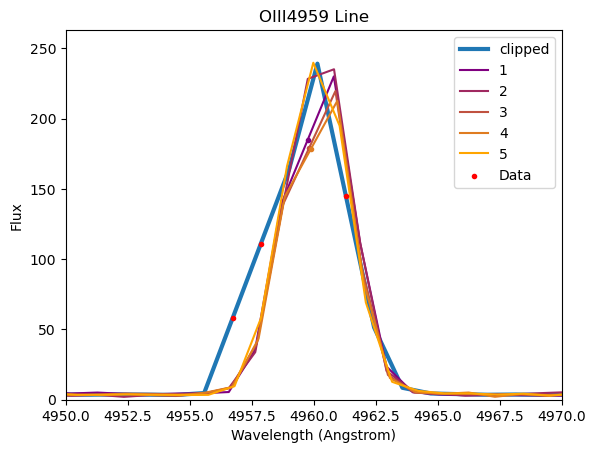

26
4614-55604-502
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


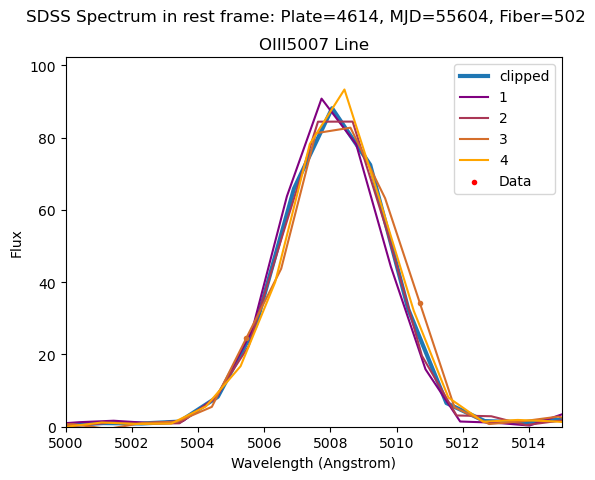

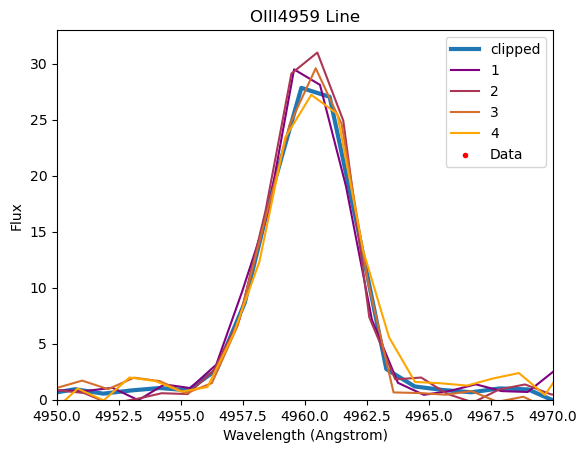

27
4622-55629-262
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


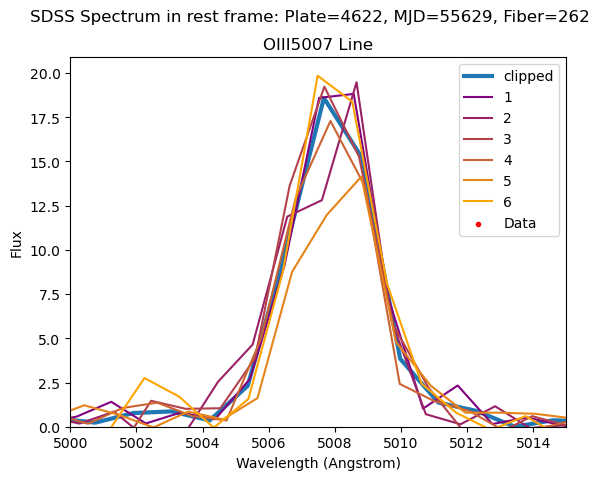

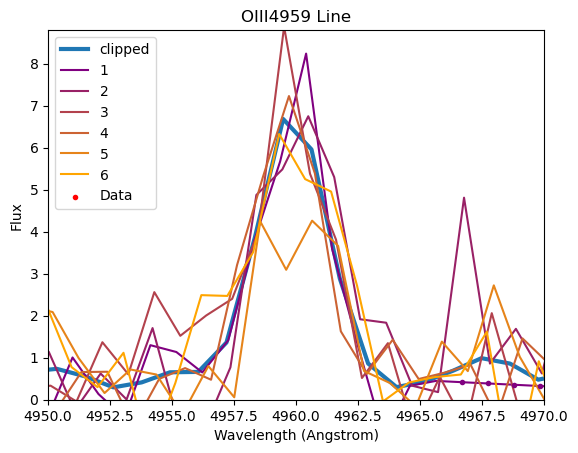

28
4638-55956-131
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


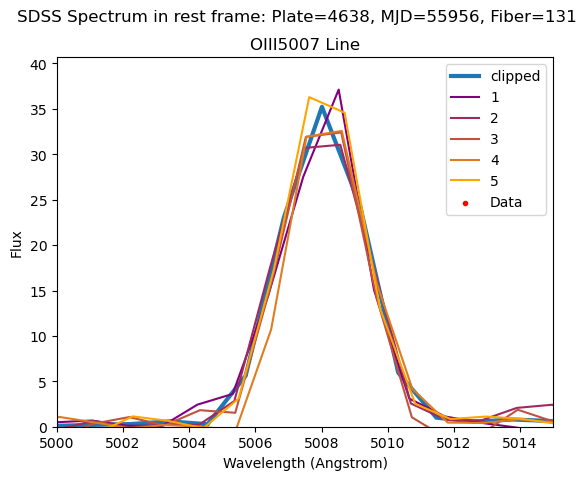

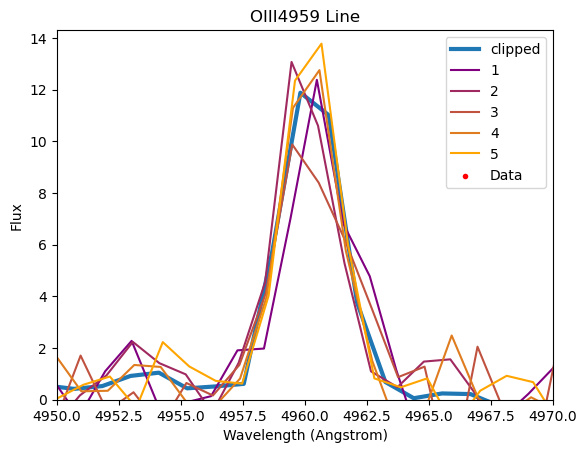

29
4653-55622-332
[1727]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


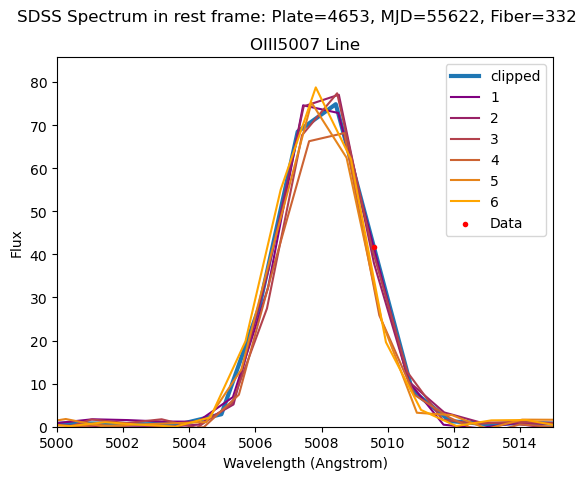

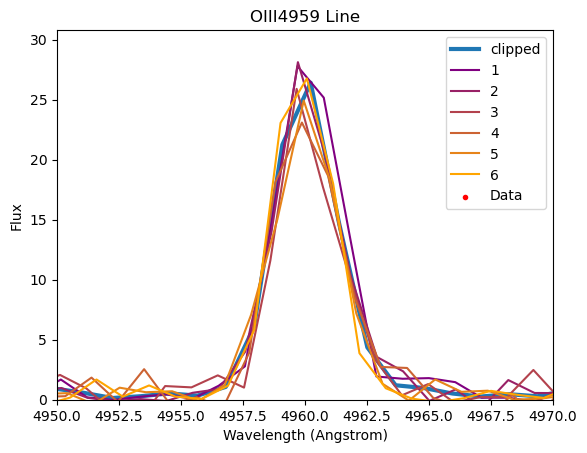

30
4699-55684-531
[1753, 1754, 1755, 1756, 1757]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


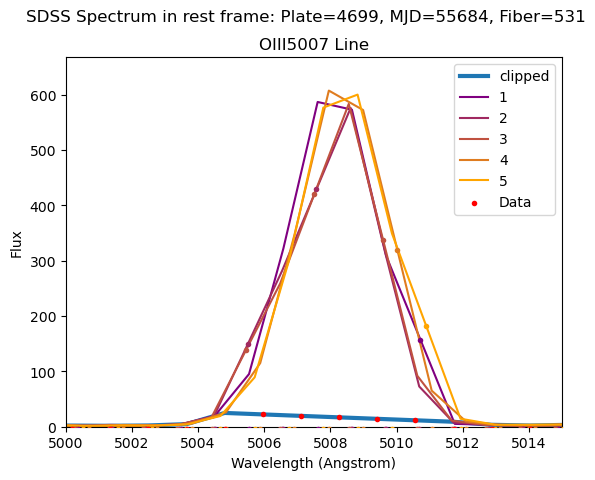

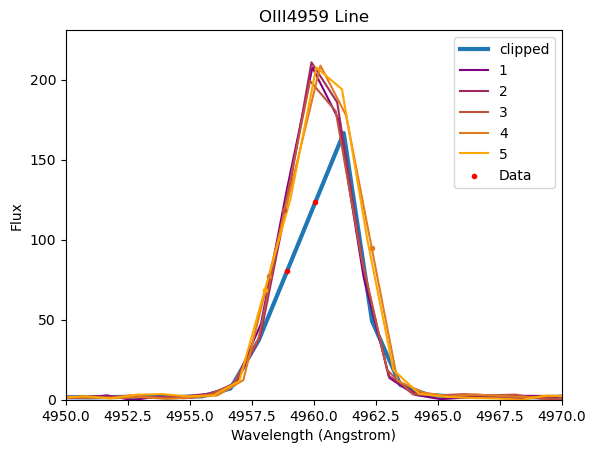

31
4752-55653-166
[1664]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


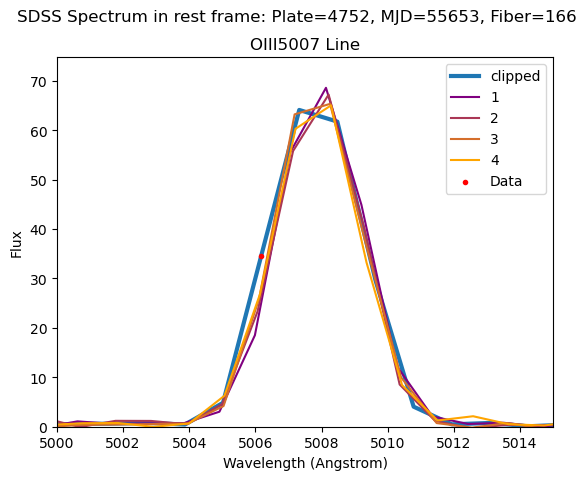

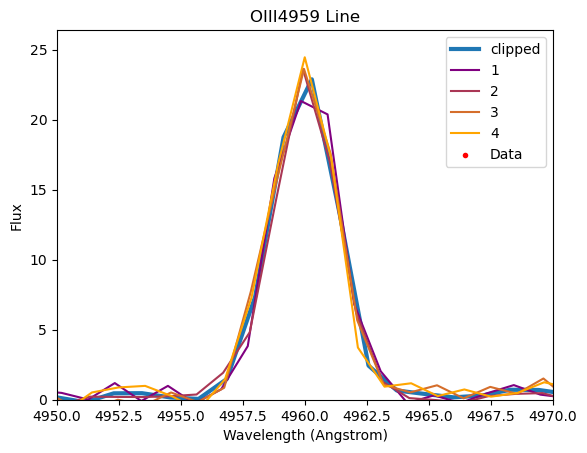

32
4772-55654-849
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


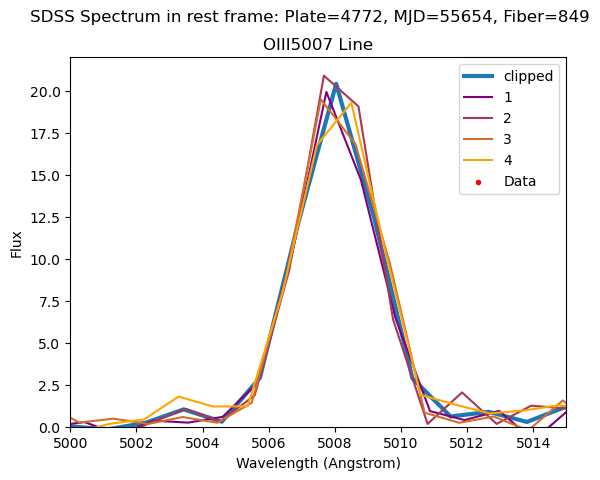

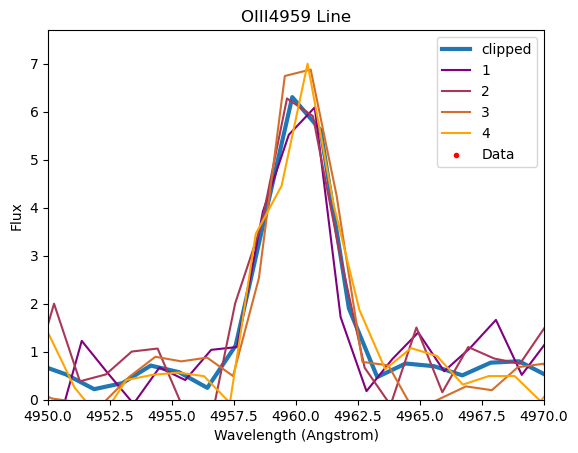

33
4806-55688-564
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


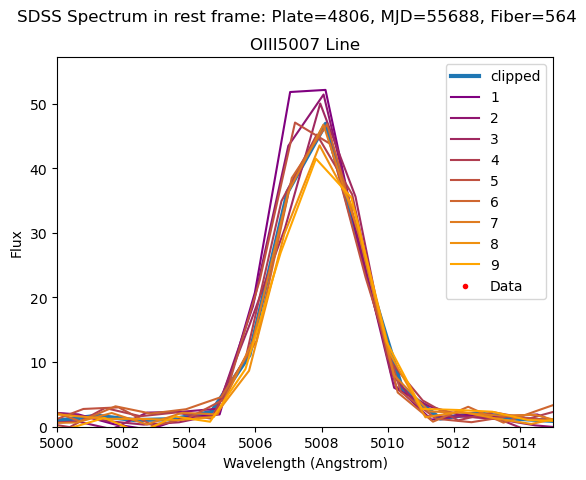

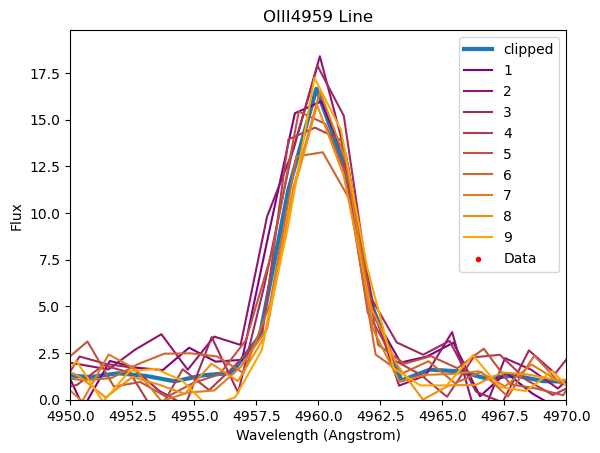

34
4839-55703-701
[1746, 1747, 1748, 1749, 1750, 1751, 1752, 1753, 1754, 1755, 1756, 1757]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


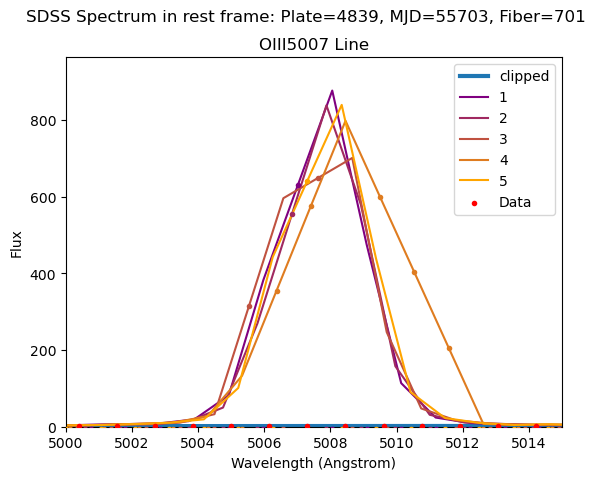

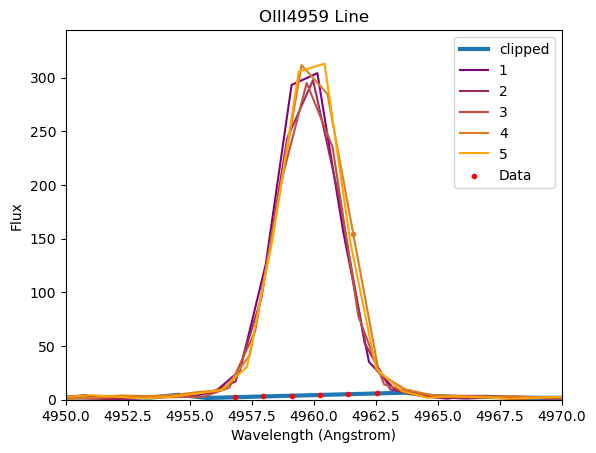

35
4851-55680-128
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


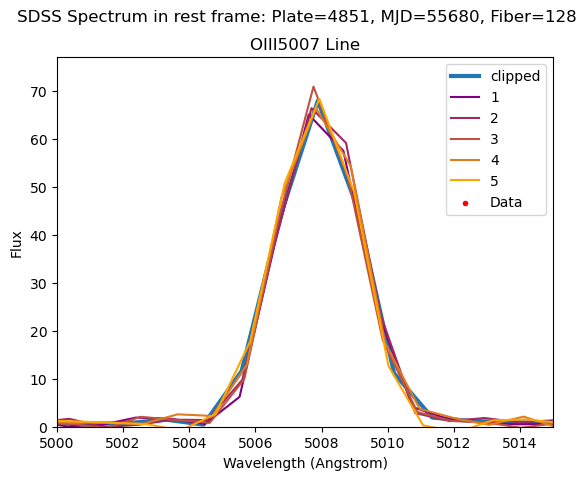

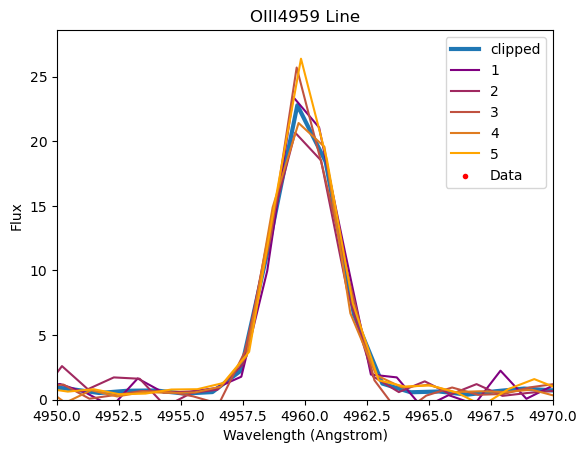

36
4895-55708-827
[1815, 1816, 1817, 1818, 1819, 1820, 1821, 1822]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


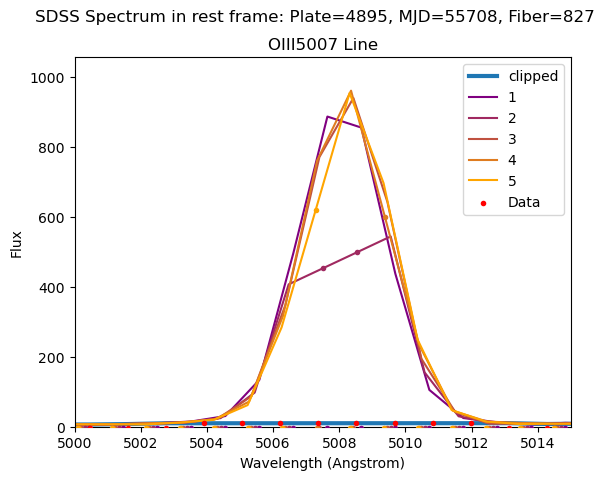

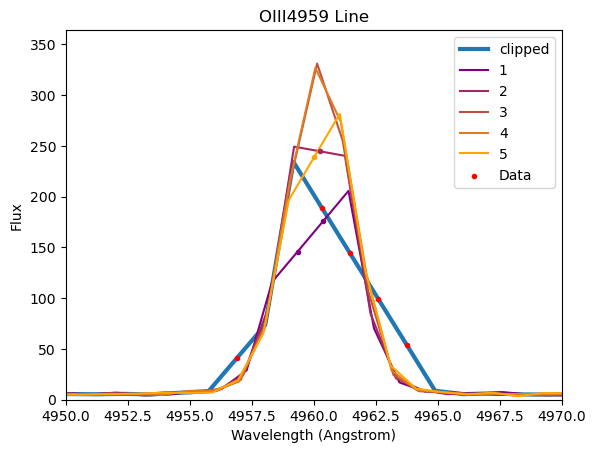

37
4977-56047-184


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[1738, 1739, 1740, 1741]


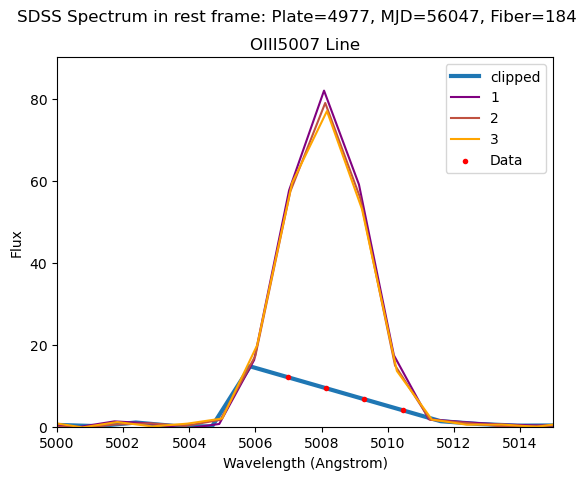

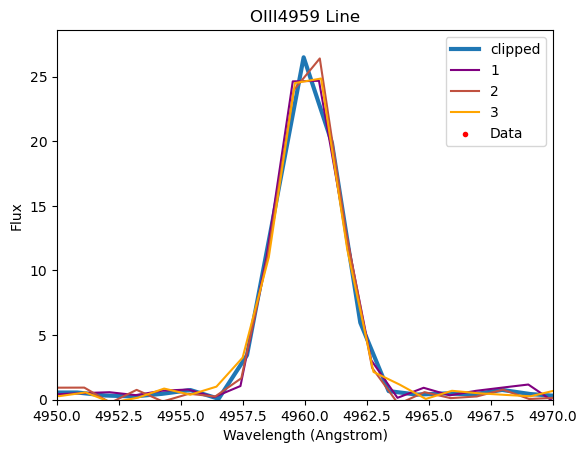

38
5133-55860-203
[1795, 1796, 1797, 1799]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


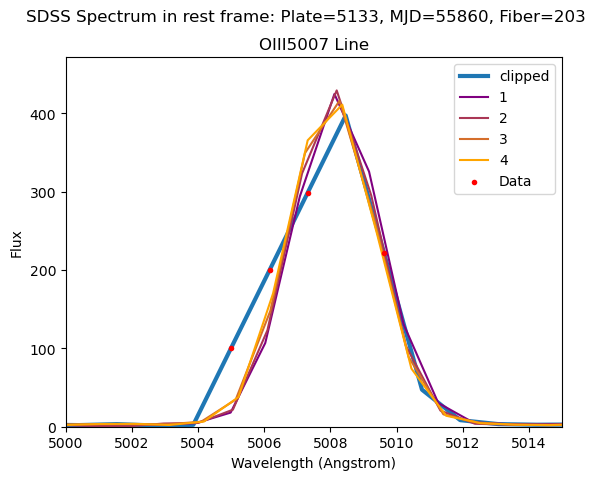

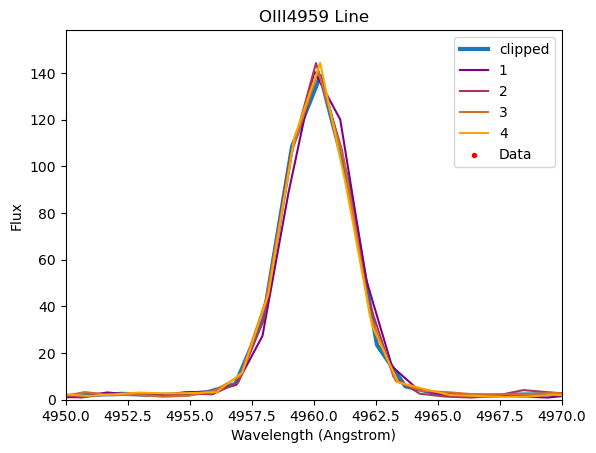

39
5297-55913-379
[1801]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


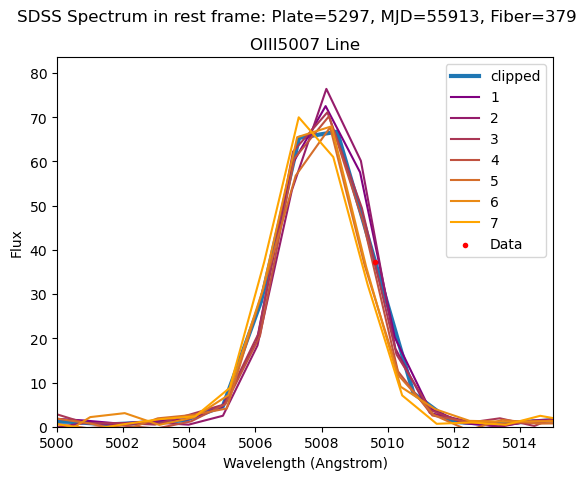

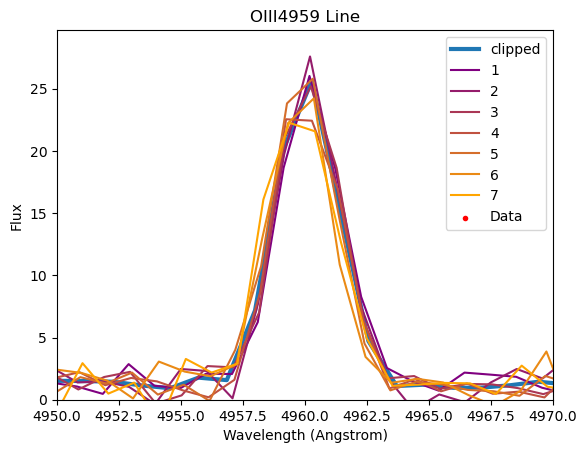

40
5316-55955-108
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


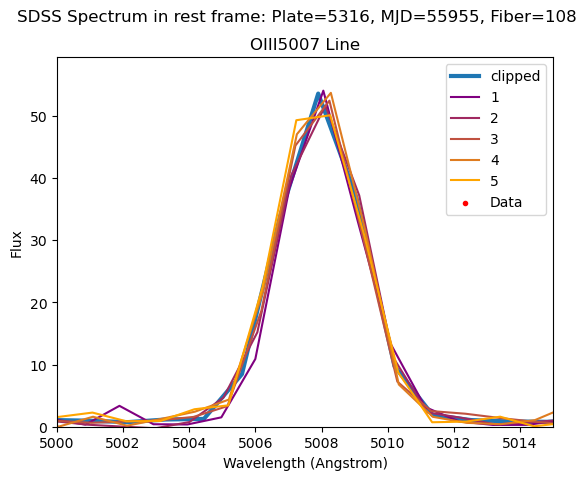

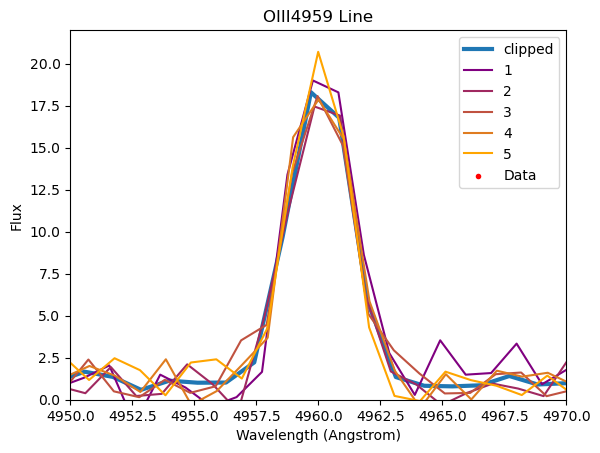

41
5695-55978-162
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


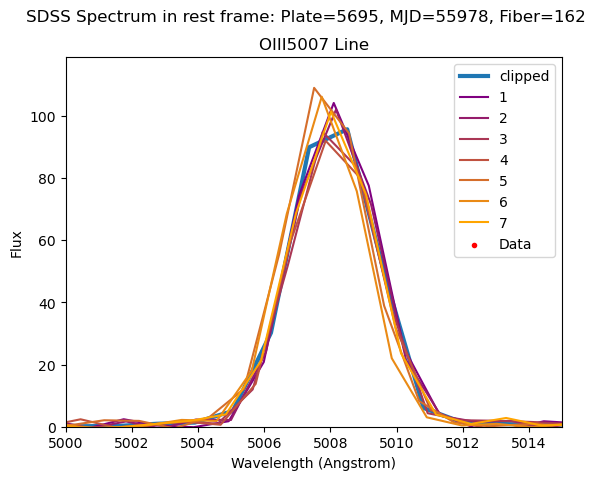

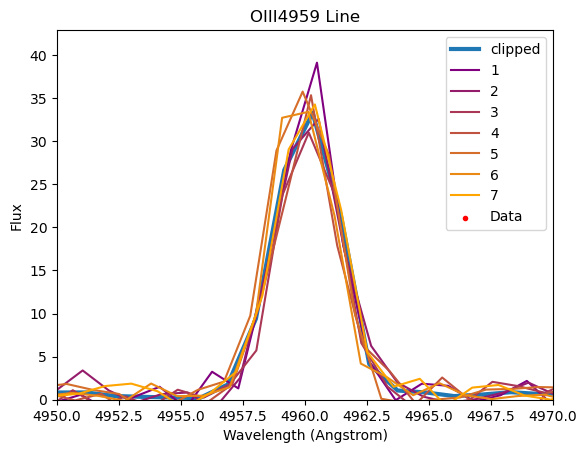

42
5900-56043-511
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


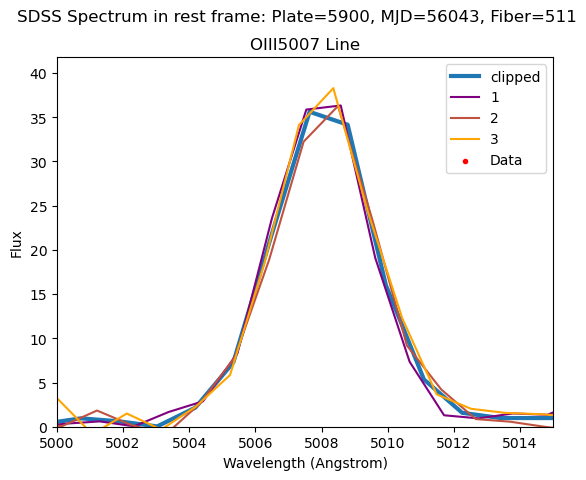

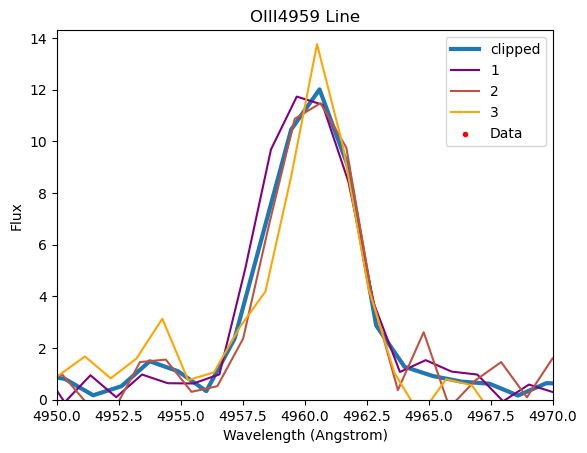

43
5974-56314-346
[1710]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


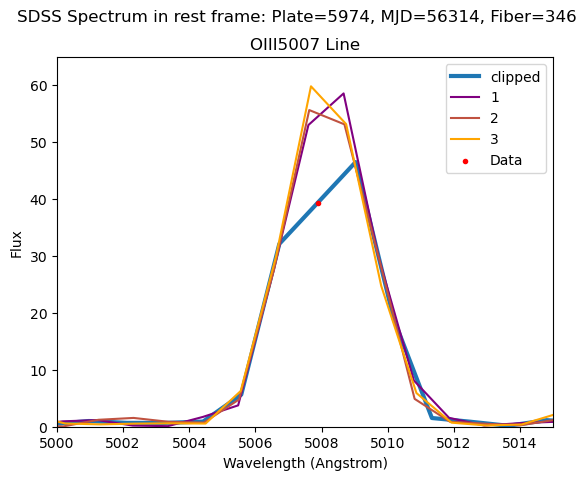

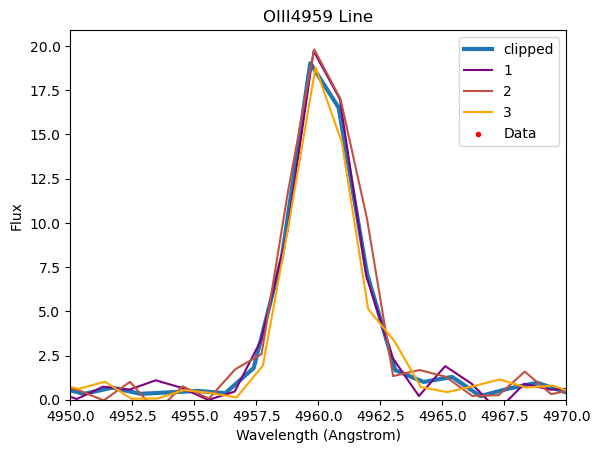

44
6254-56268-654
[1607]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


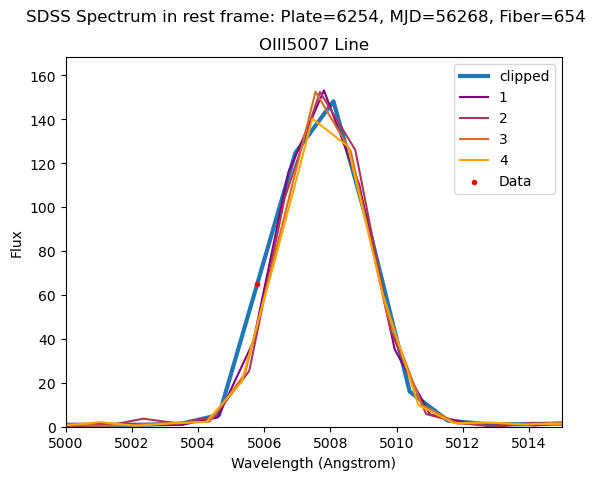

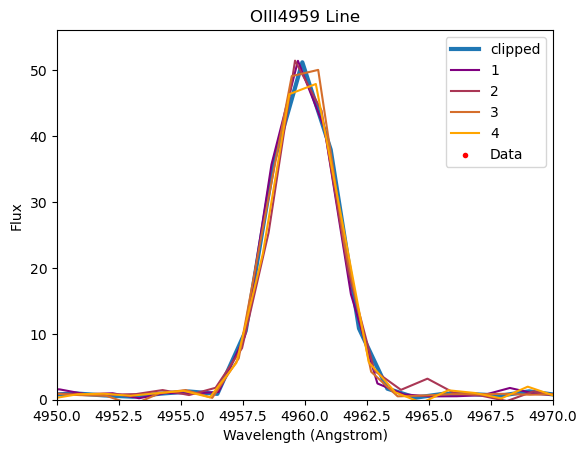

45
6262-56267-718
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


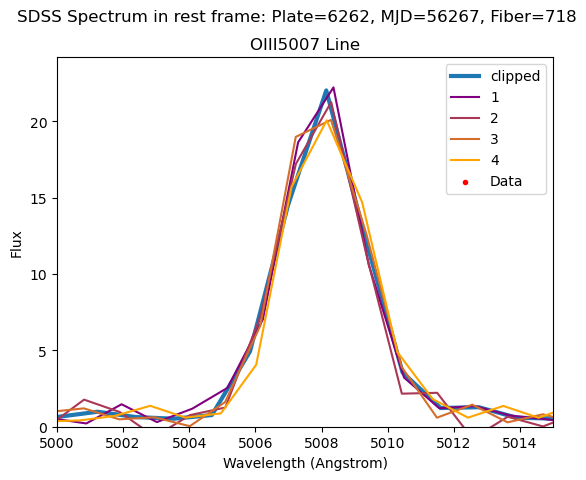

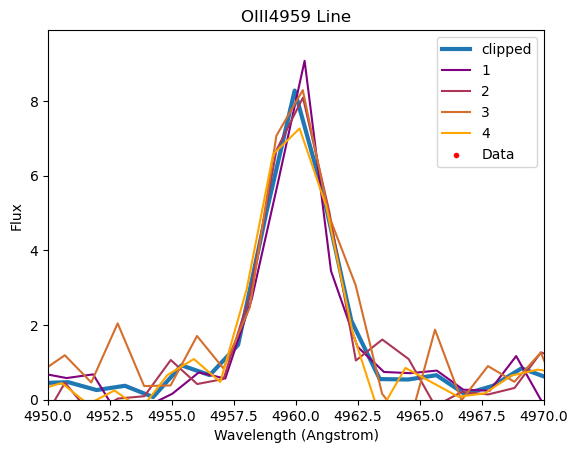

46
6272-56325-512
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


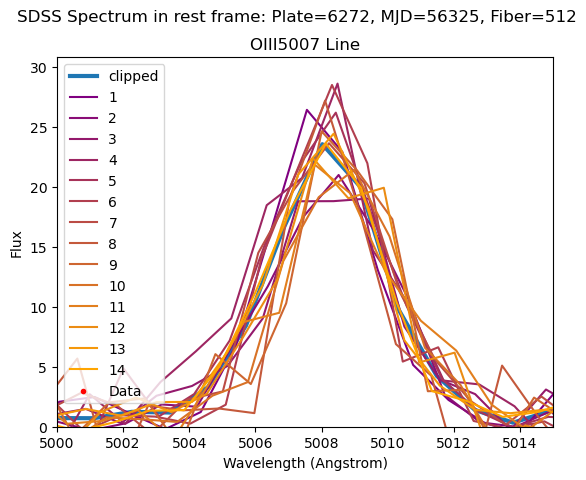

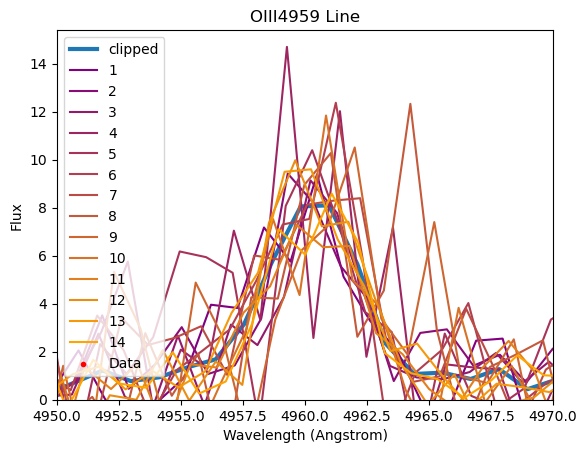

47
6311-56447-384
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


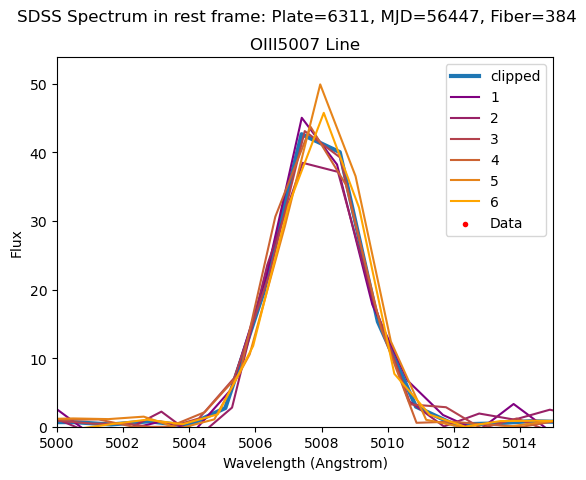

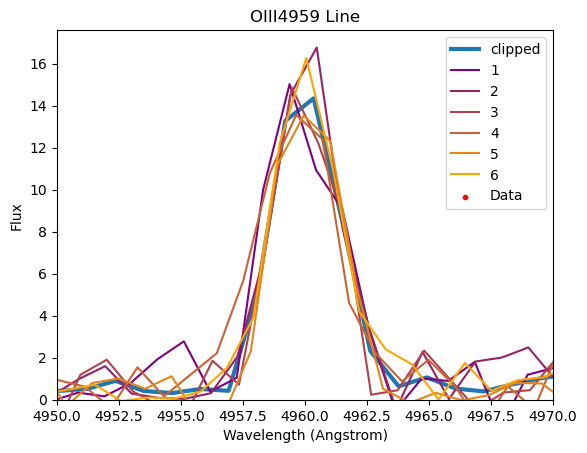

48
6409-56306-367


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[1839, 1840, 1841, 1842, 1843]


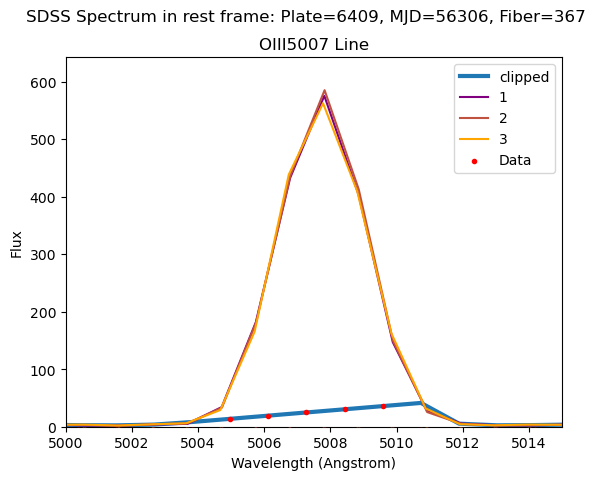

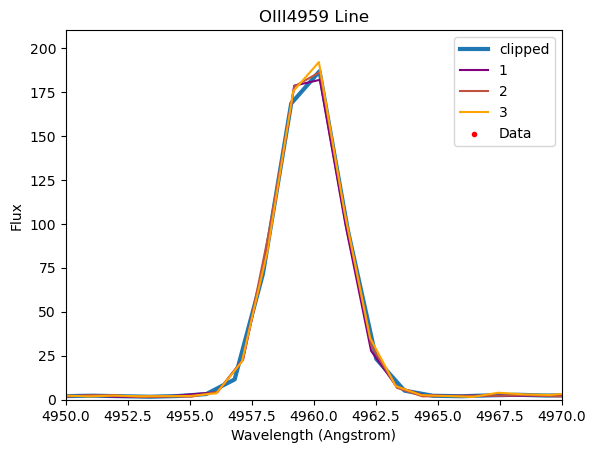

49
6445-56366-516
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


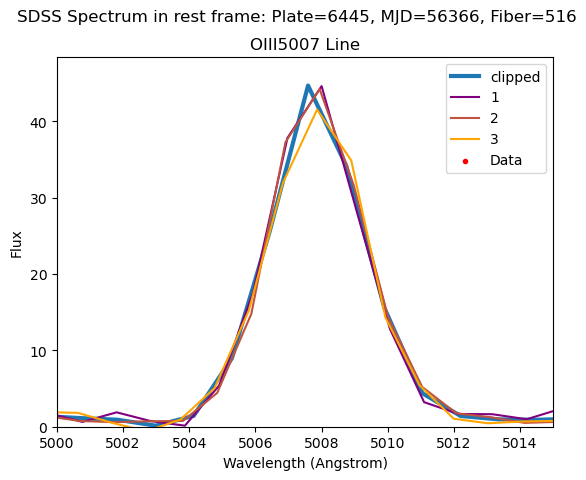

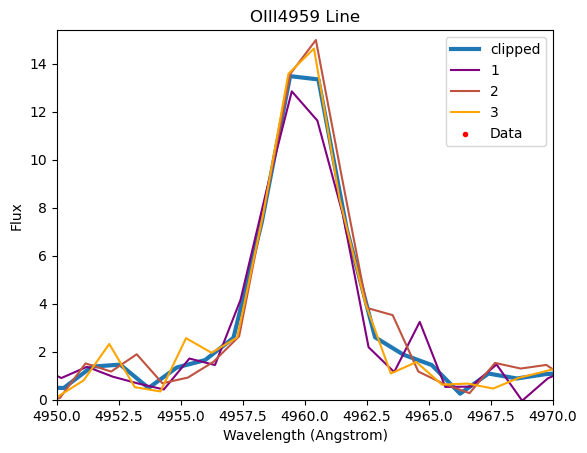

50
6445-56366-937
[1754, 1755, 1756, 1758]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


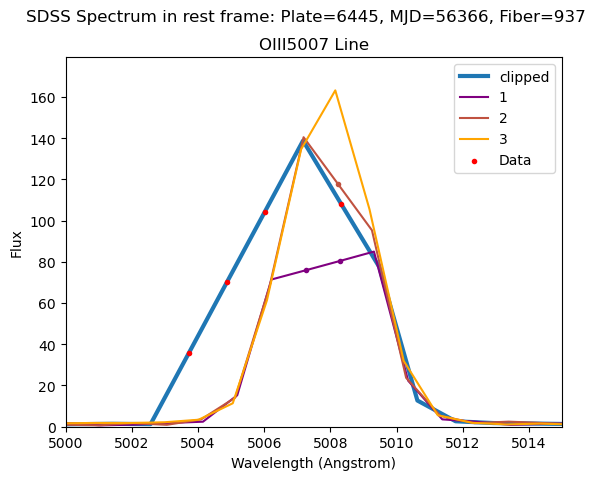

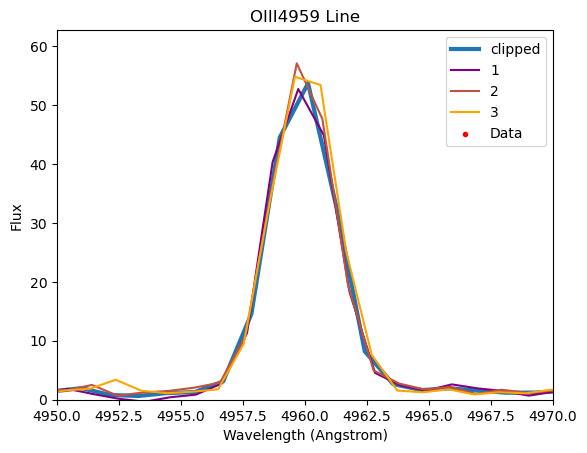

51
6480-56340-570
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


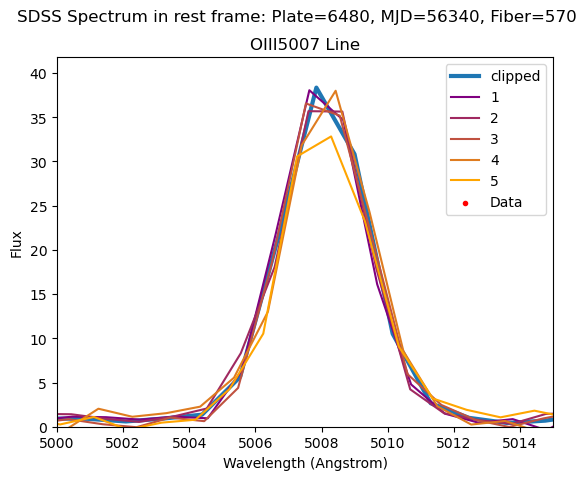

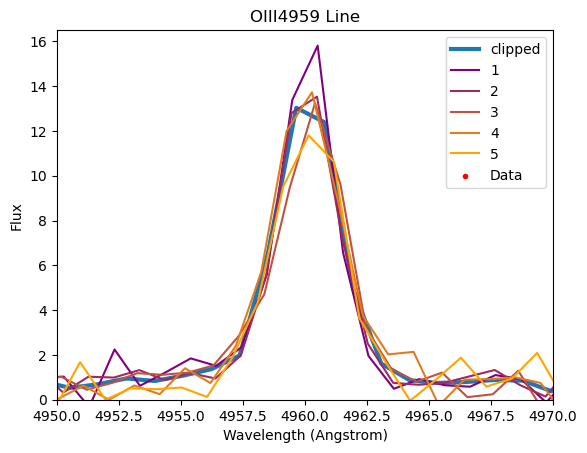

52
6512-56567-344
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


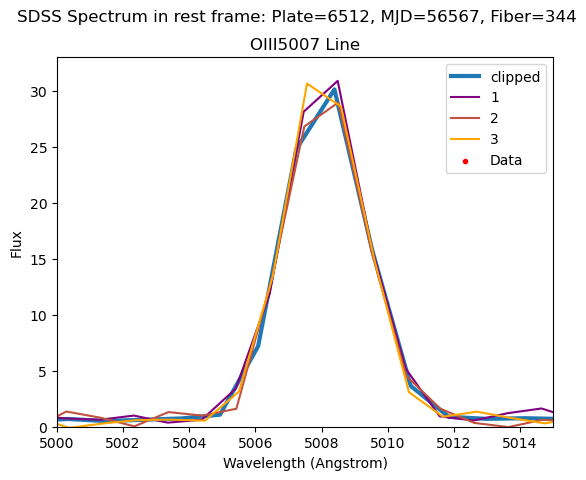

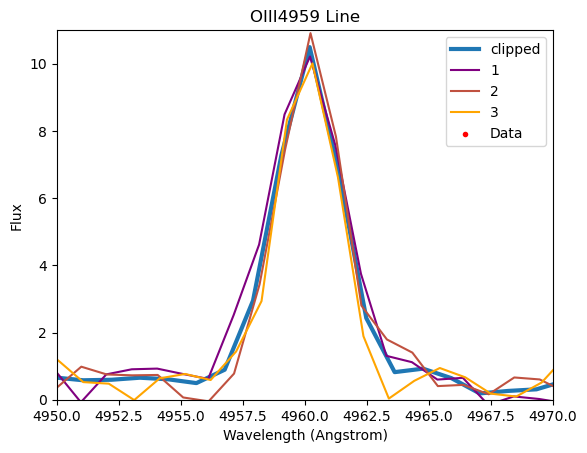

53
6513-56543-640
[1664, 1665, 1666]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


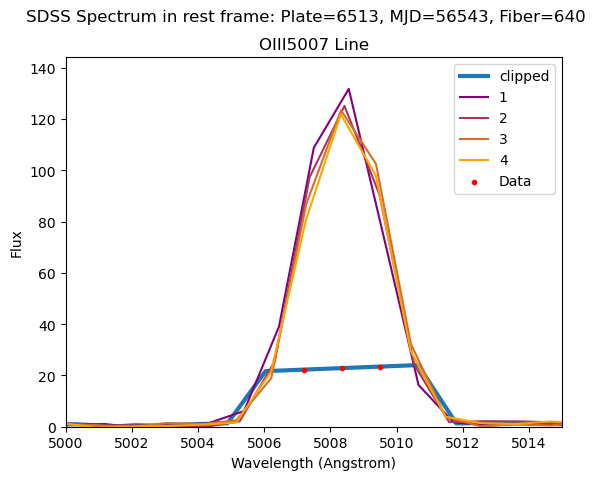

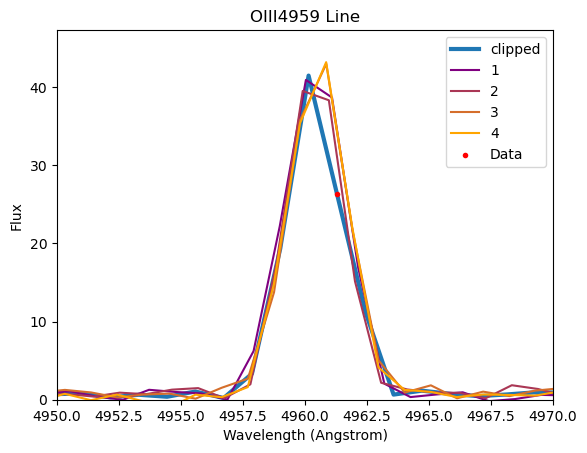

54
6514-56487-217


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[]


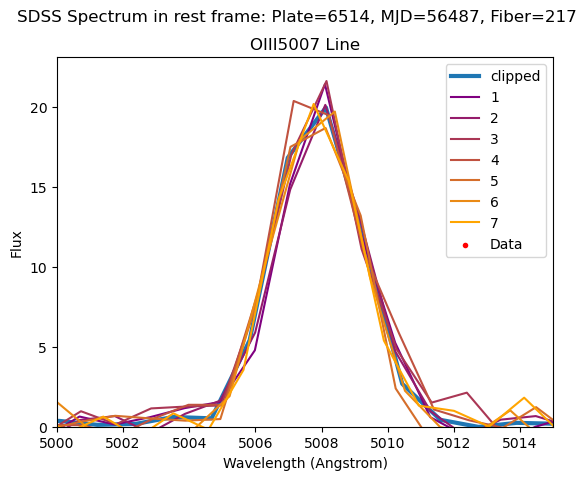

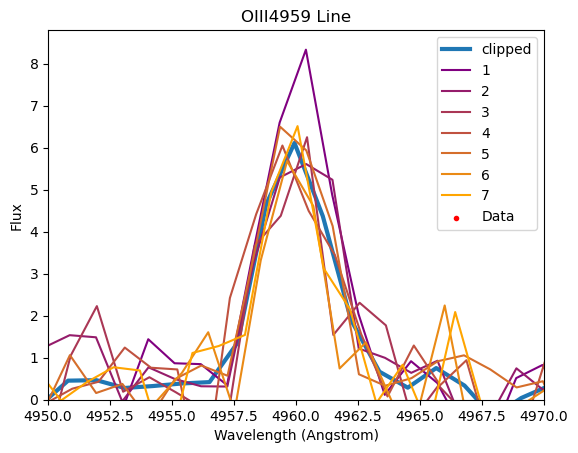

55
6518-56567-726
[1660, 1661, 1663, 1664]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


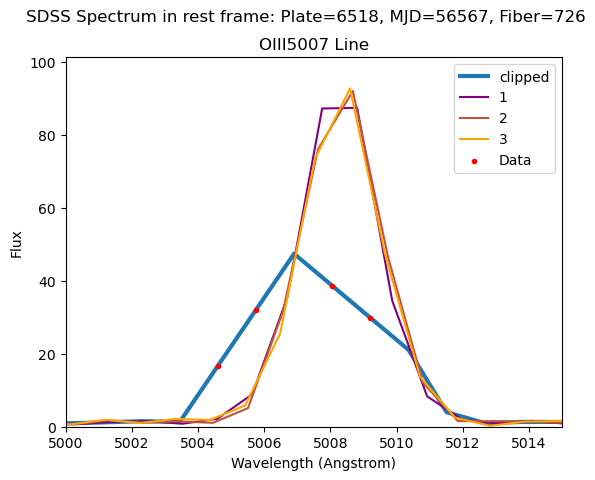

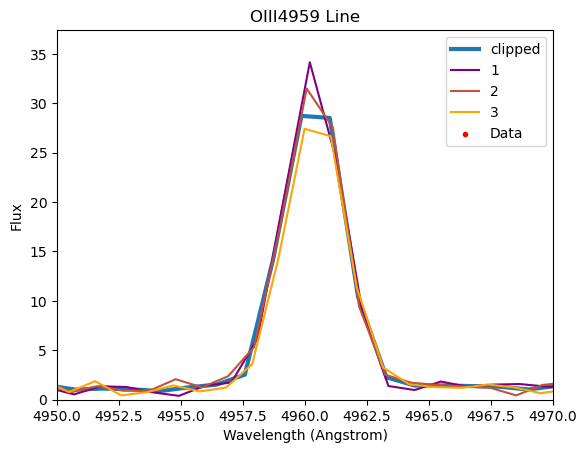

56
6521-56537-132
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


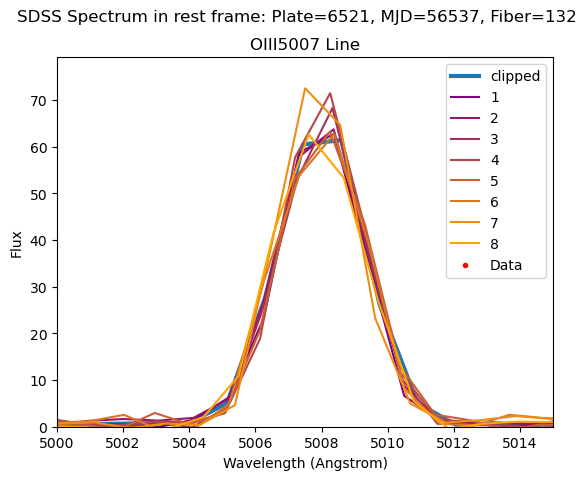

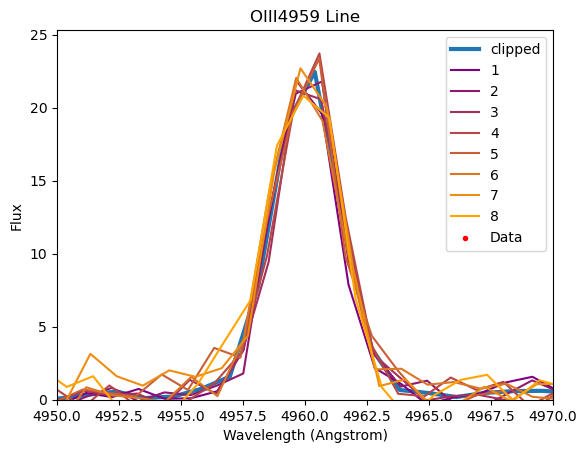

57
6694-56386-172
[1733, 1734, 1735]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


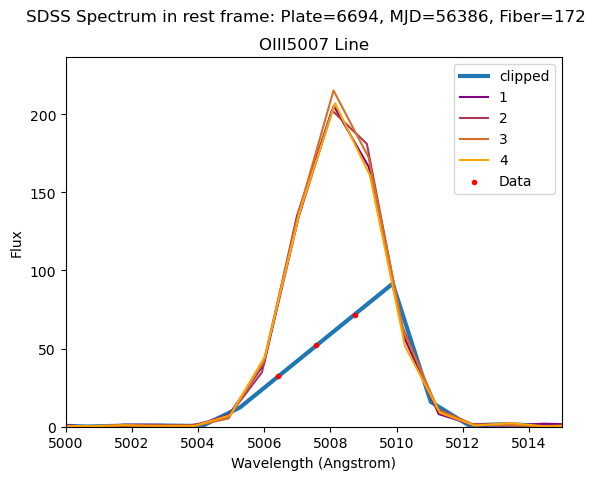

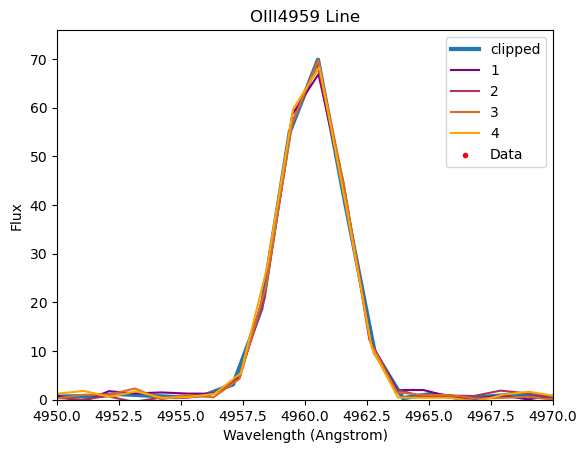

58
6715-56449-448
[1707, 1708]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


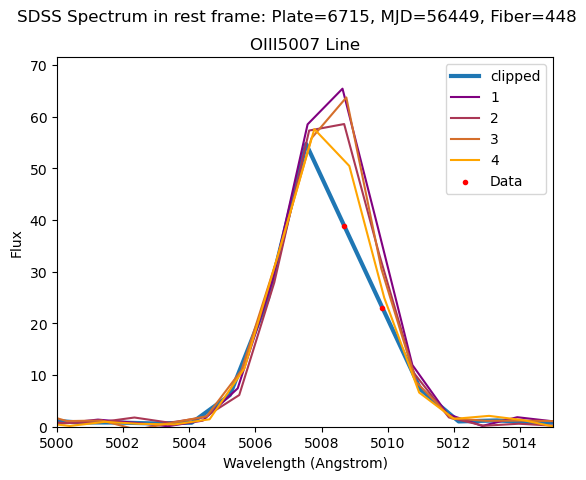

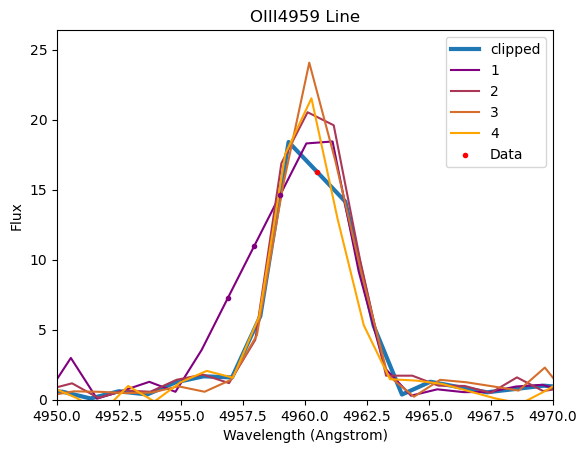

59
6975-56720-648
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


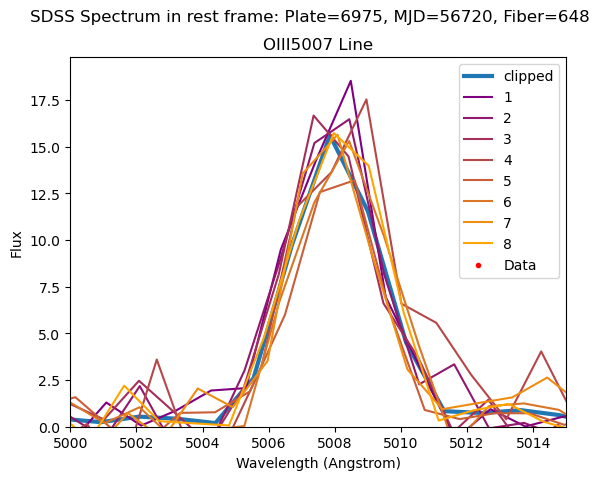

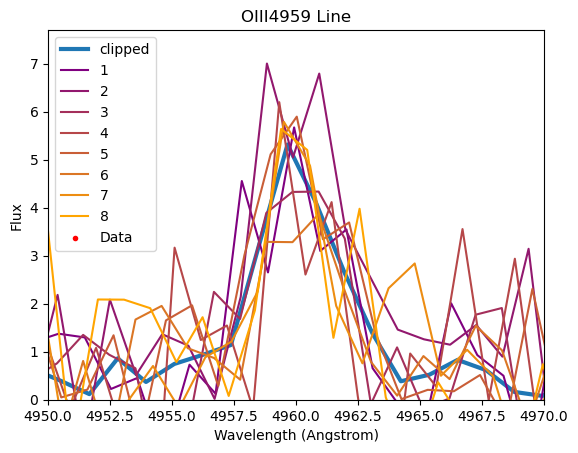

60
7027-56448-420
[1678, 1679, 1680]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


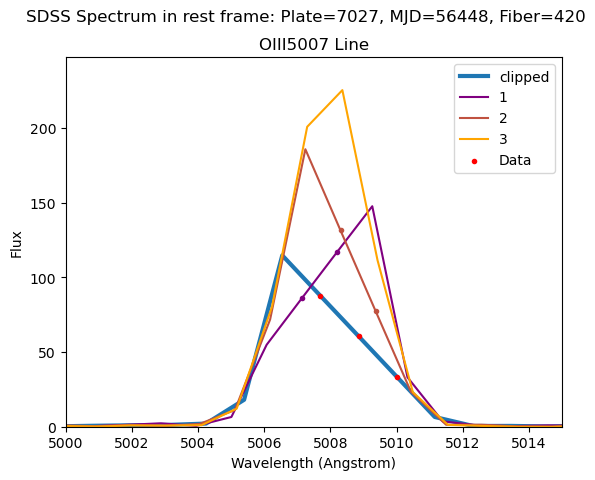

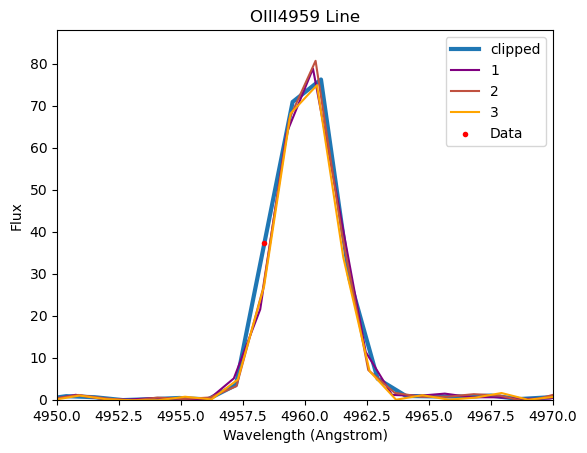

61
7034-56564-540
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


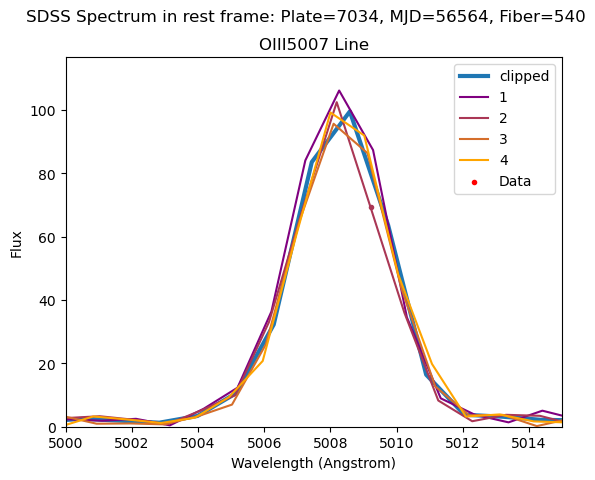

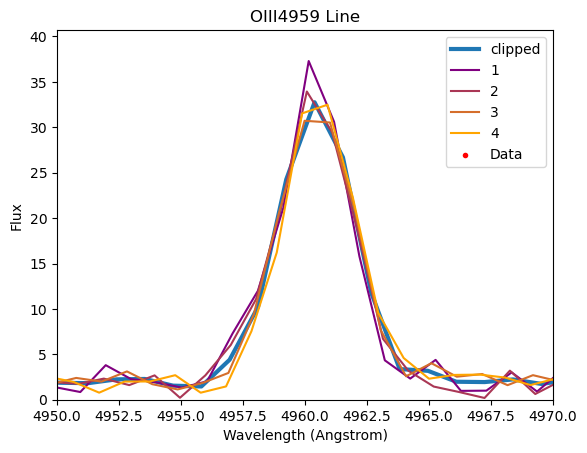

62
7081-56684-1000
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


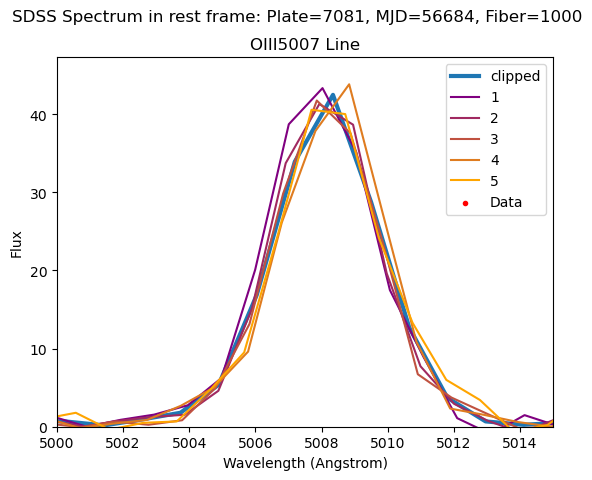

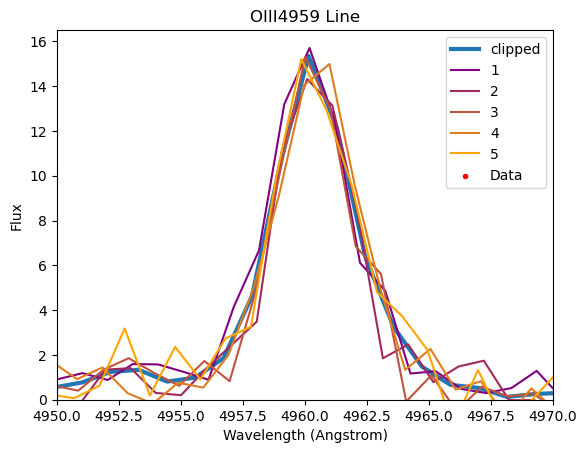

63
7151-56598-404
[1569]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


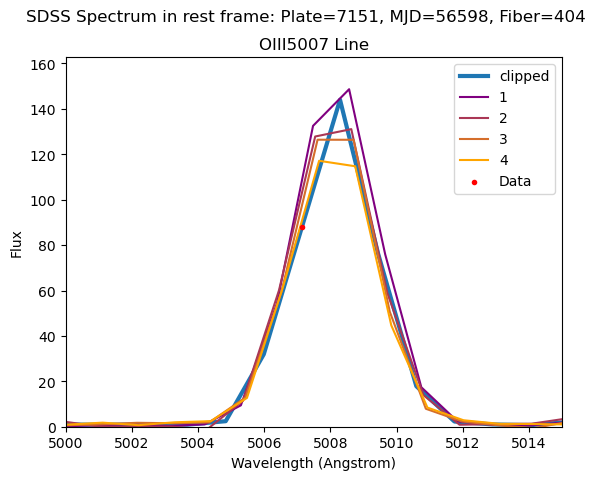

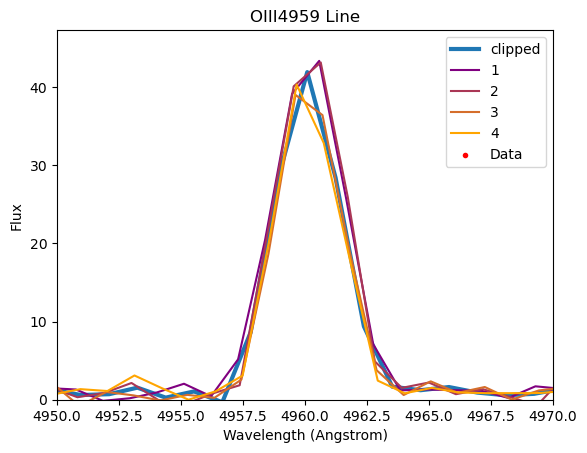

64
7153-56904-861
[1794, 1795, 1796, 1797, 1798]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


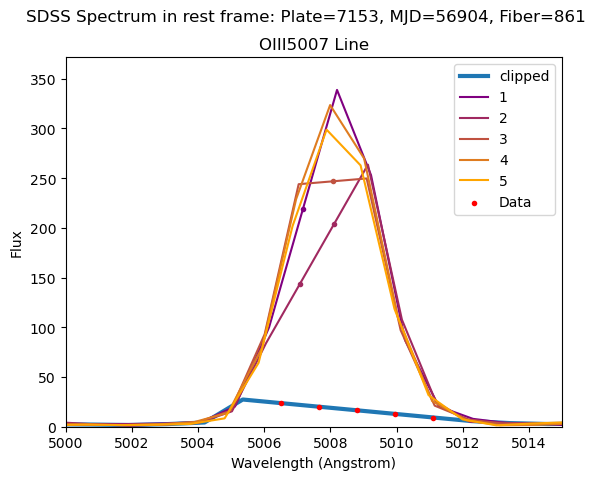

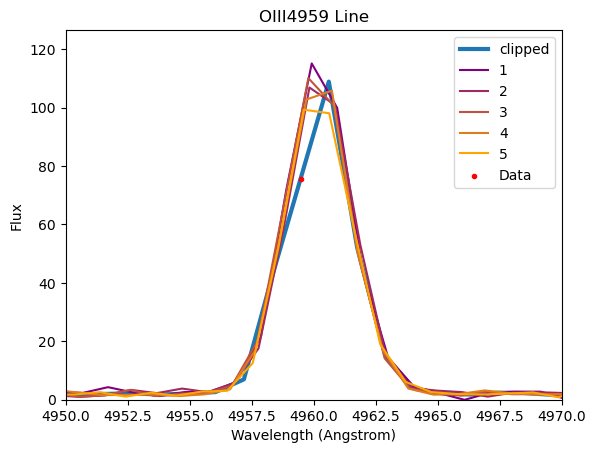

65
7289-57039-102


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[]


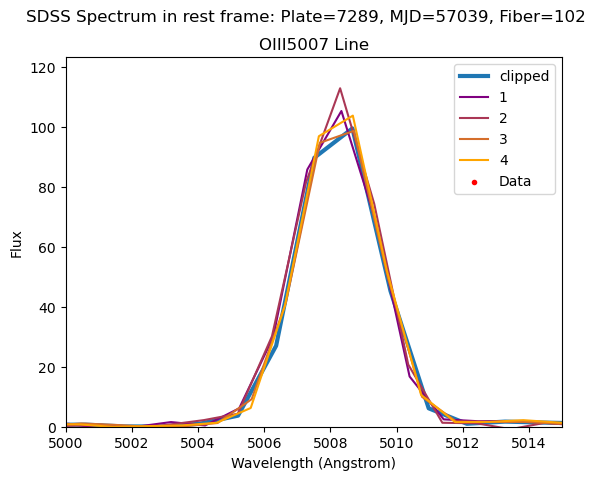

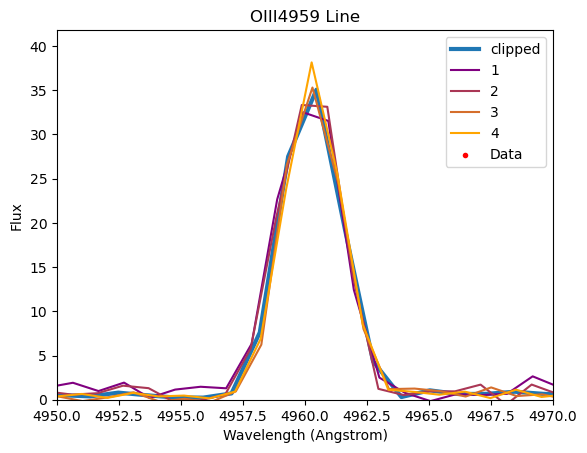

66
7315-56685-165
[1655, 1657, 1658, 1659]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


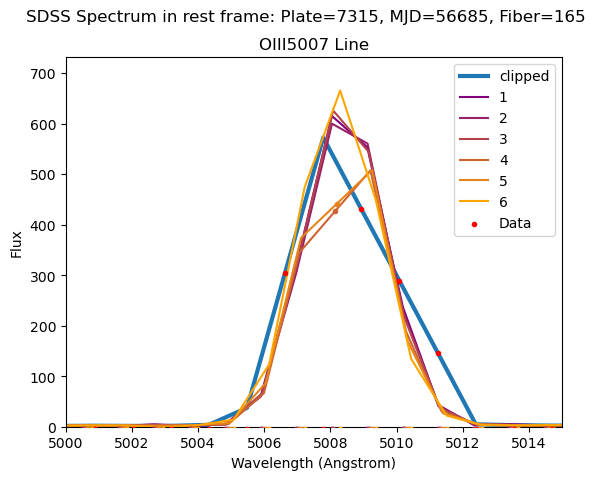

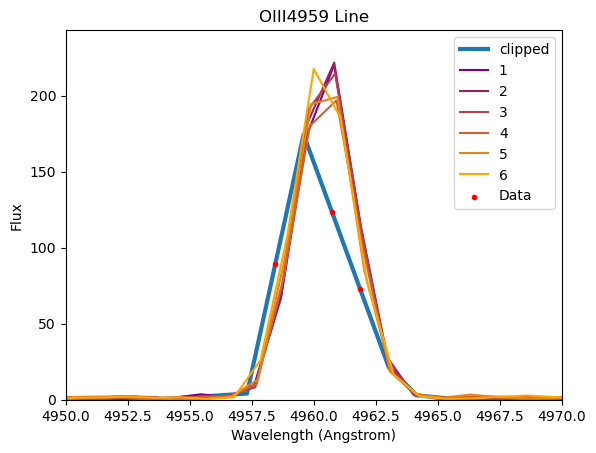

67
7336-56656-363
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


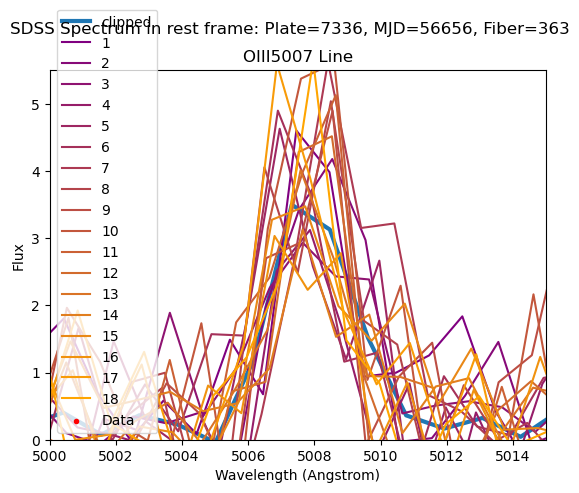

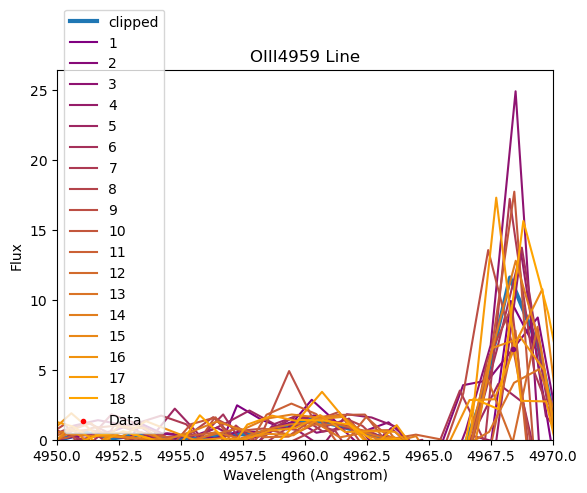

68
7396-56809-782
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


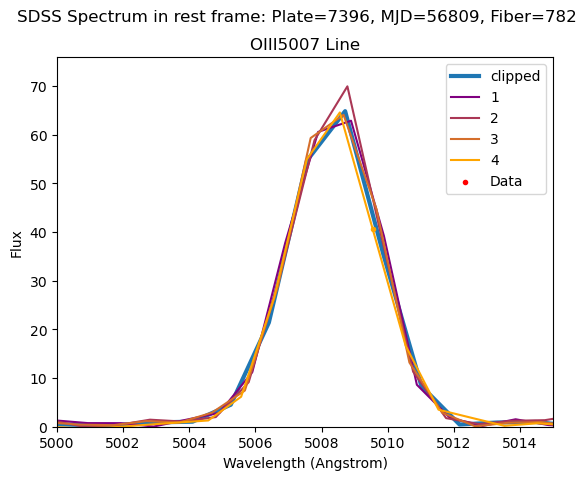

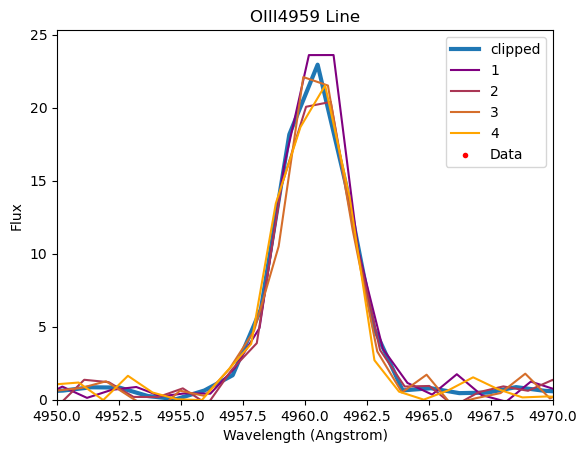

69
7404-56776-446
[1520, 1522]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


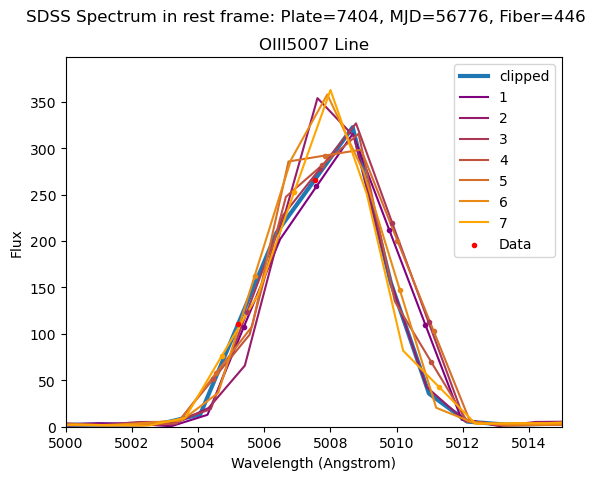

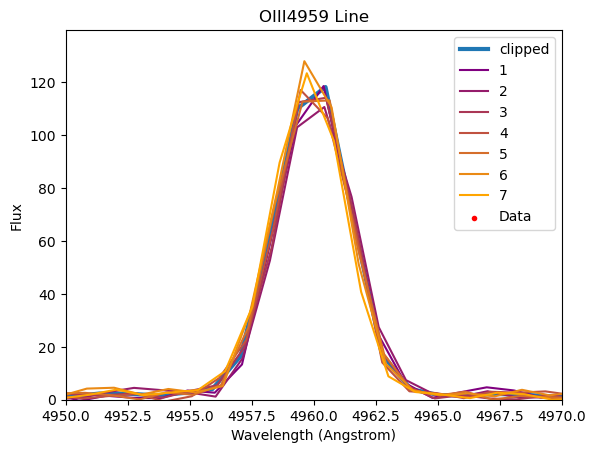

70
7427-56751-620


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[1847, 1848, 1849, 1851]


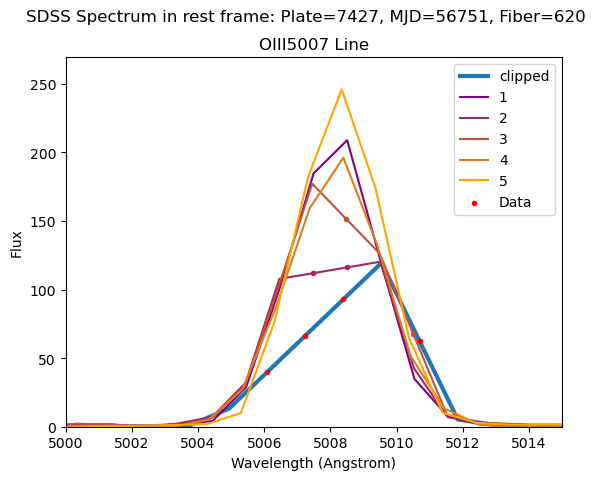

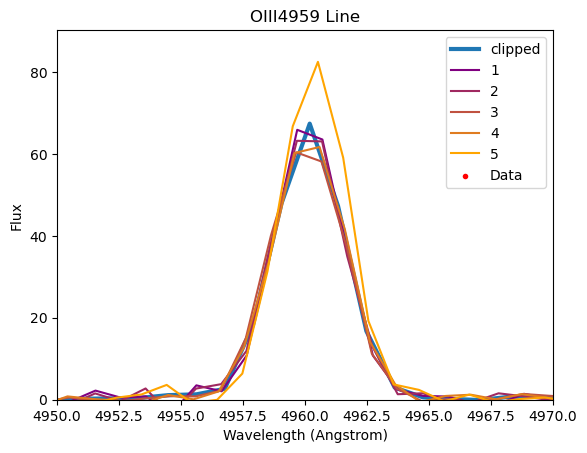

71
7572-56944-383
[1634, 1635, 1636, 1637, 1638, 1639]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


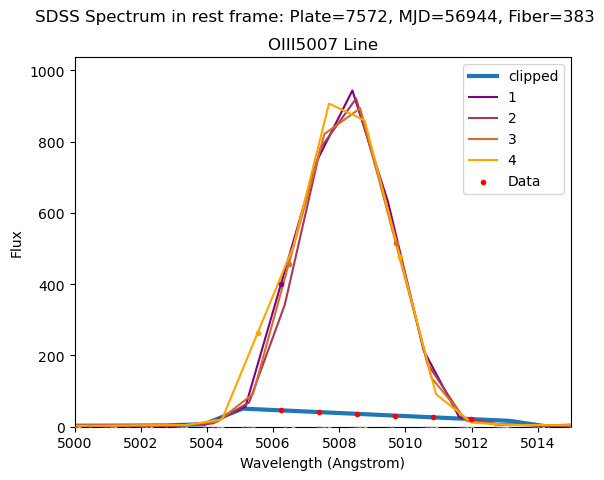

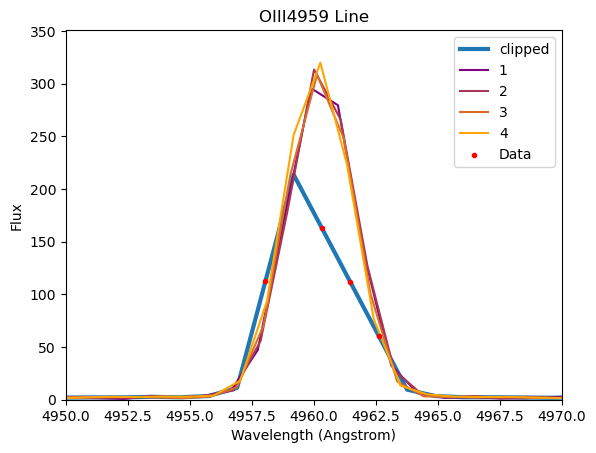

72
7581-56949-122
[1897, 1898]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


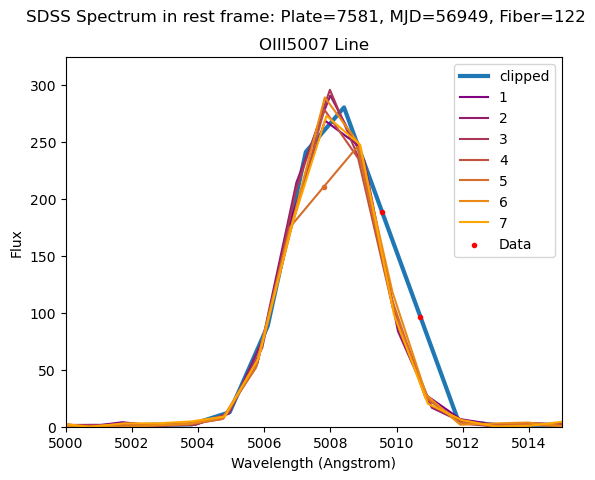

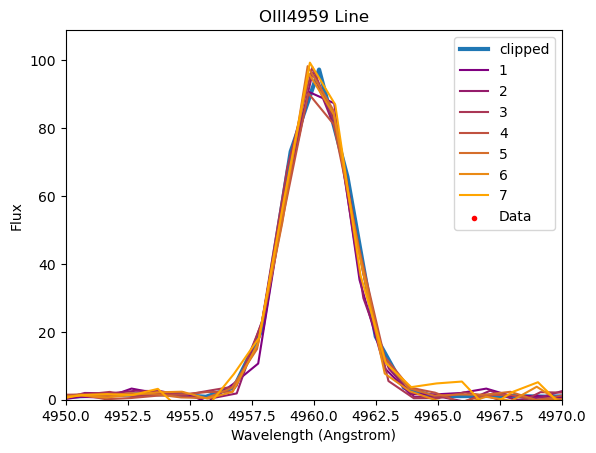

73
7626-56934-72
[1629, 1630, 1631, 1632, 1633, 1634, 1637, 1638, 1639]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


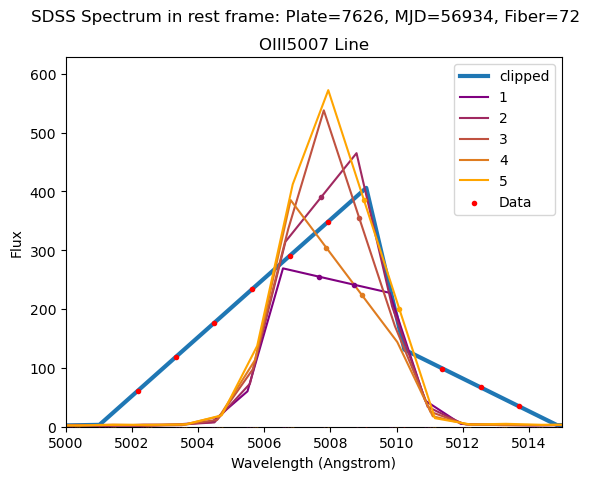

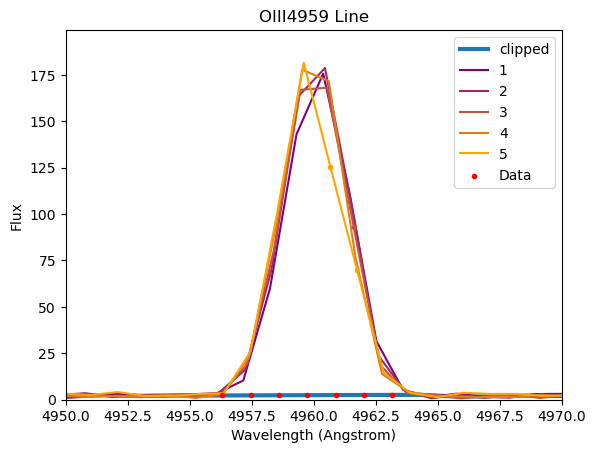

74
7629-56988-135
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


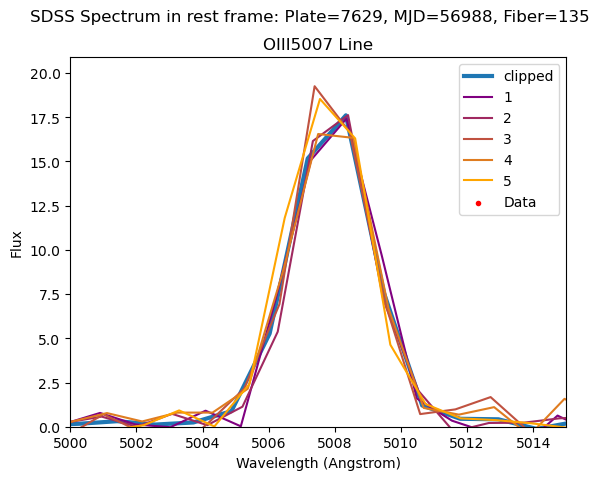

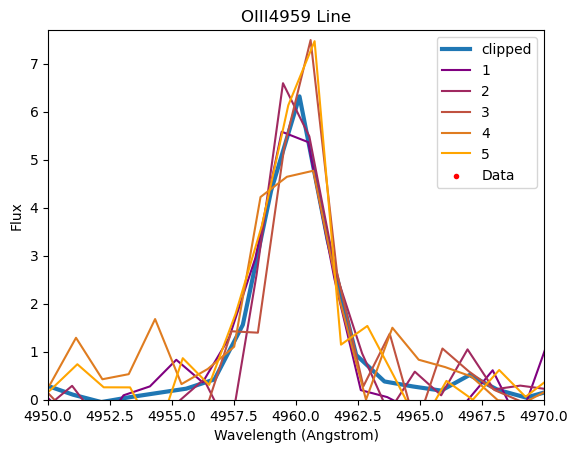

75
7643-57302-720


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[]


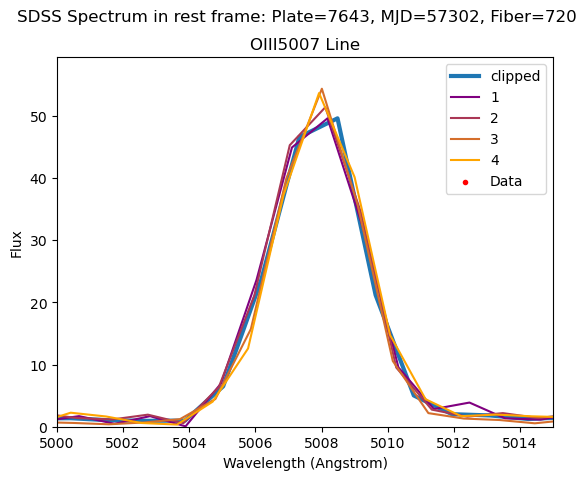

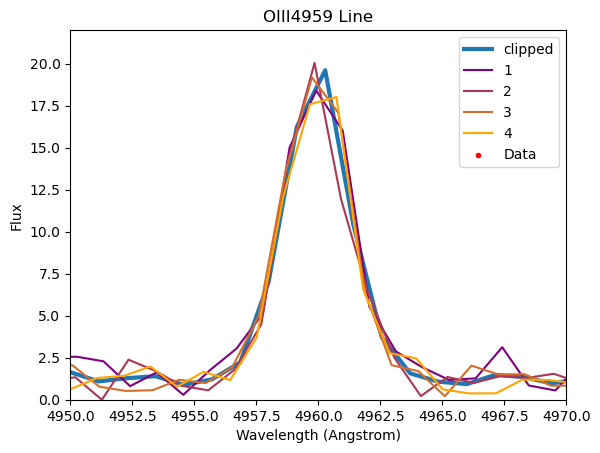

76
7653-57306-686
[1641, 1644]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


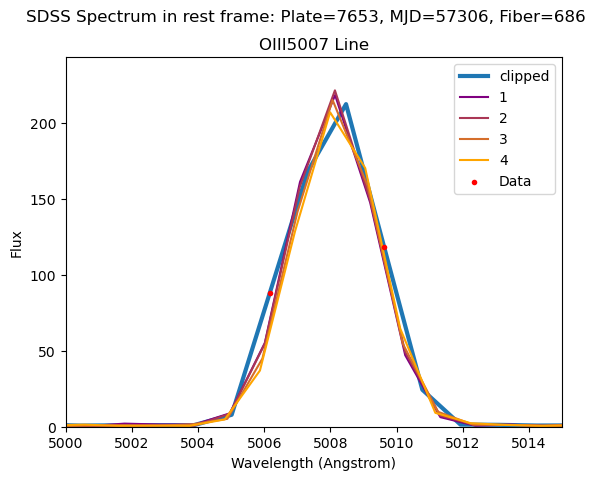

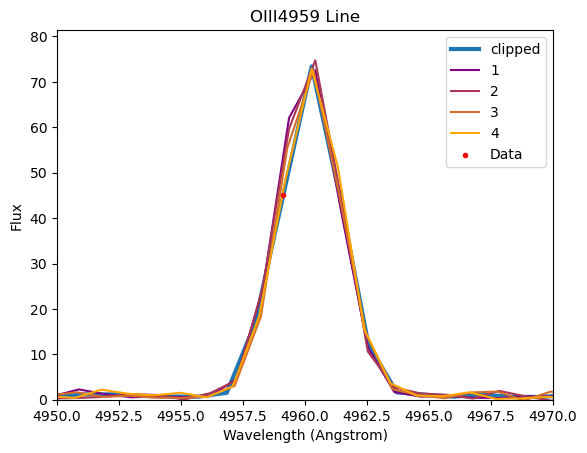

77
7661-57286-304
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


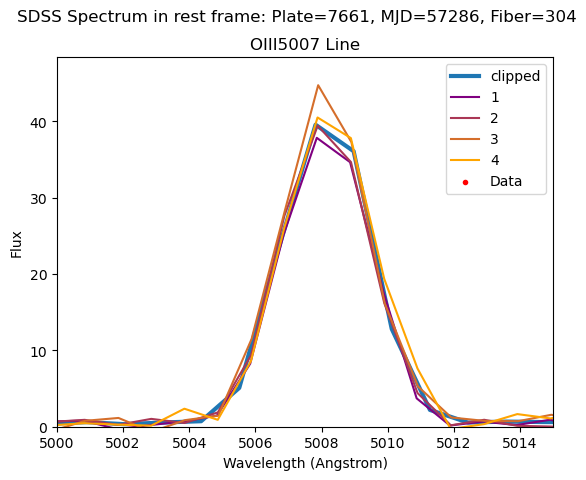

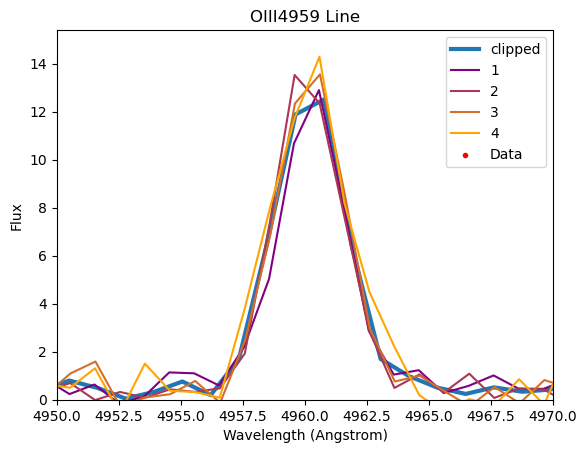

78
7673-57329-421
[2052, 2053]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


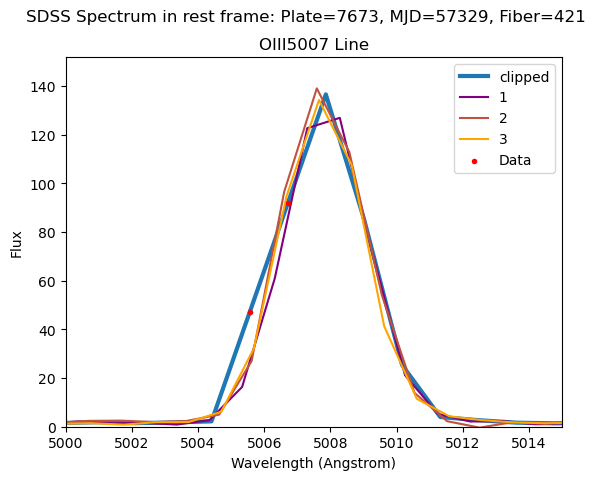

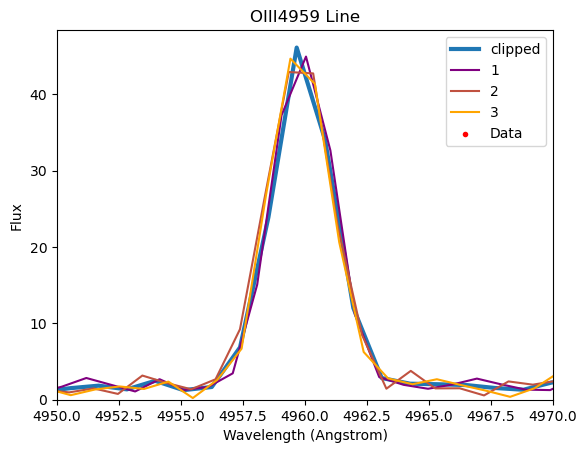

79
7678-57282-159
[1689]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


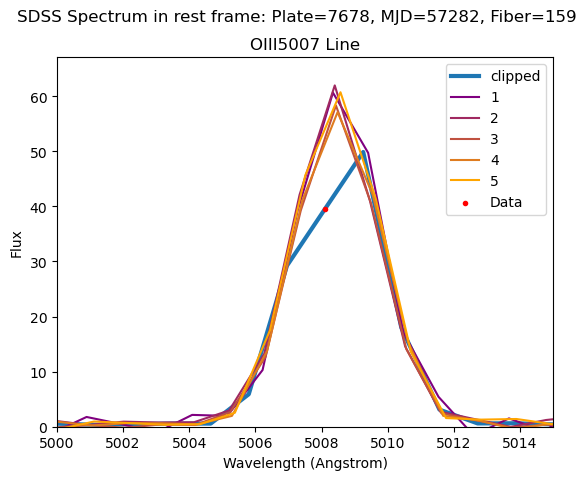

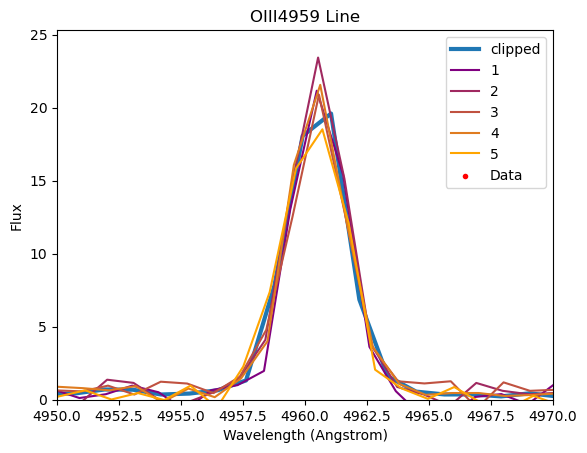

80
7690-57046-910
[1644, 1645]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


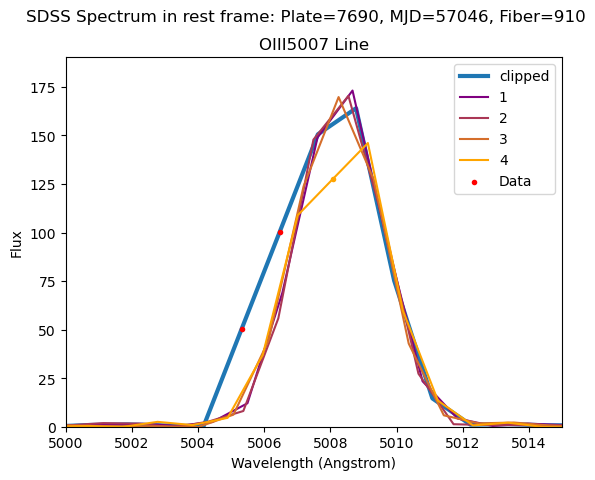

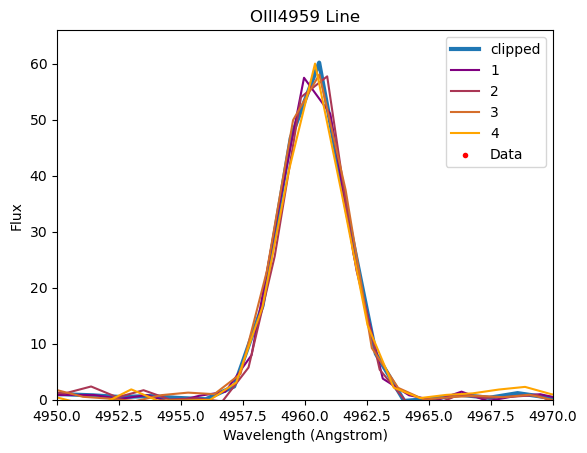

81
7710-58284-291
[1745]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


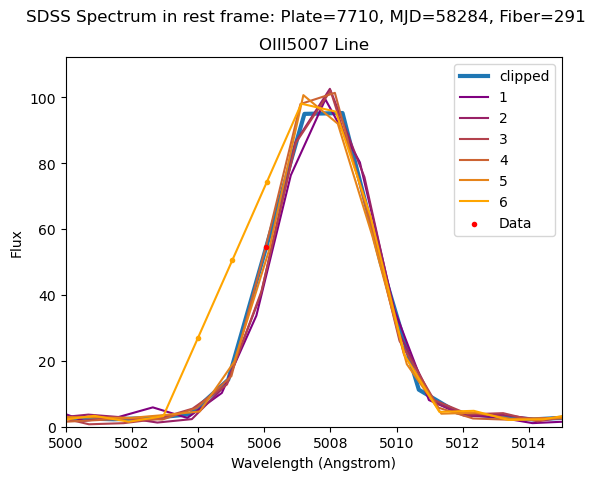

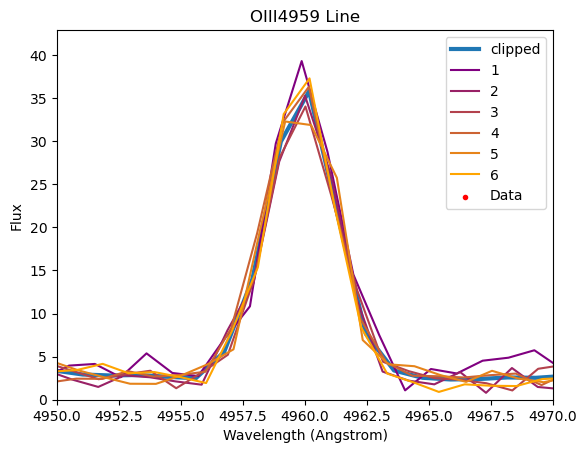

82
7711-57667-88
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


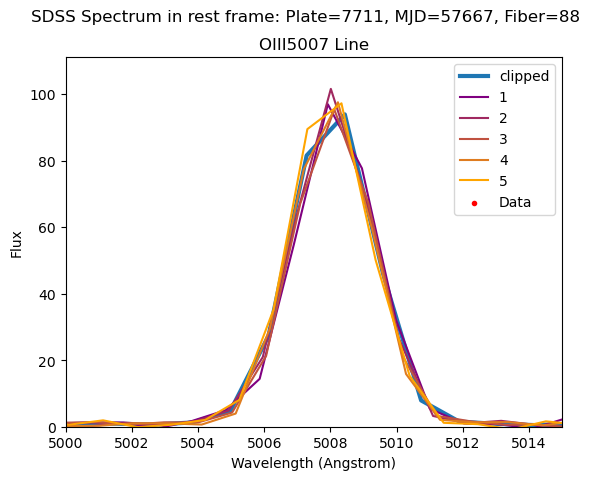

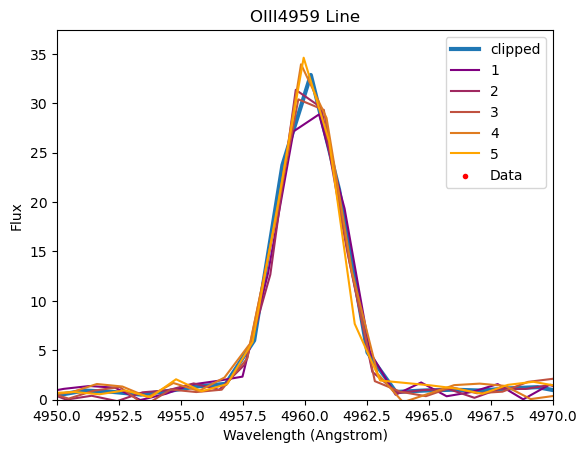

83
7885-57336-549
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


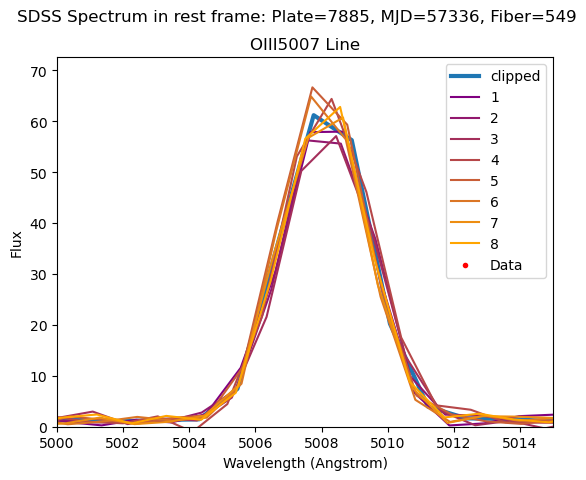

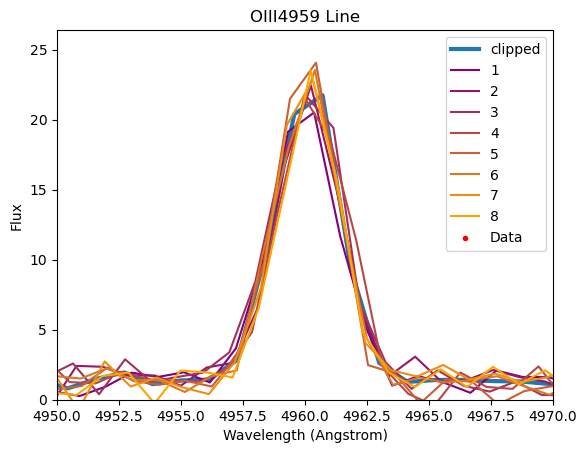

84
8054-57194-43
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


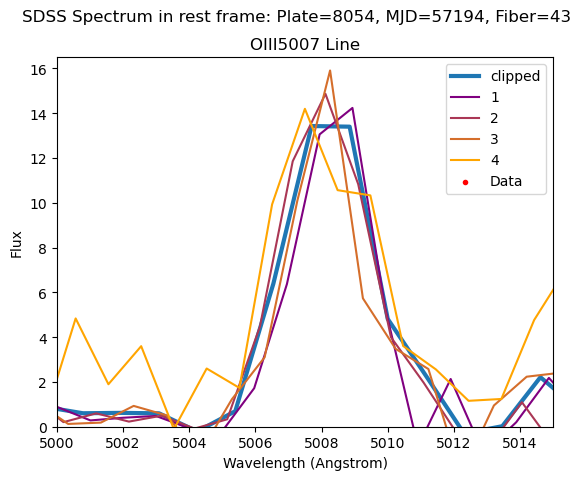

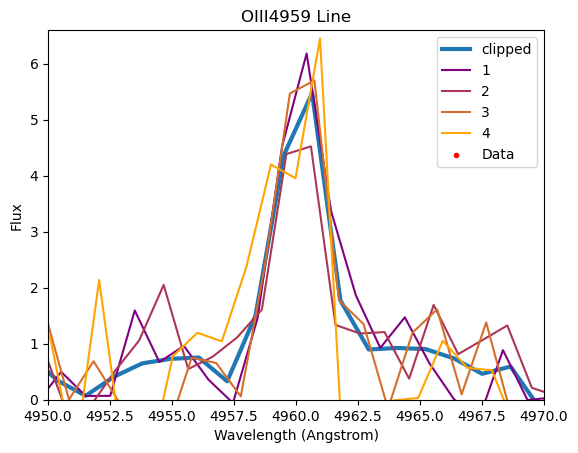

85
8057-57190-545
[1726, 1727]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


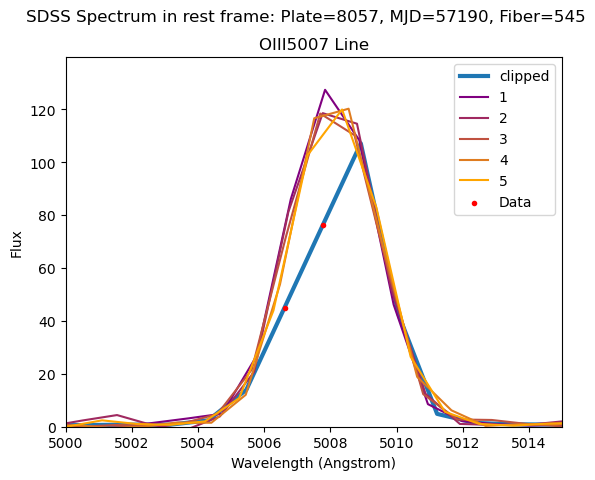

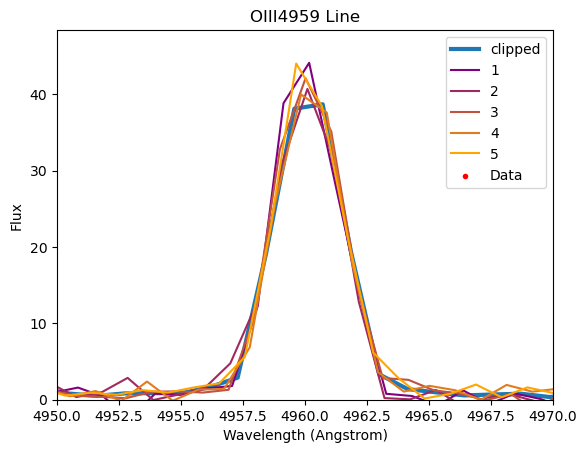

86
8059-57895-836
[1649, 1650, 1651, 1652, 1653, 1654]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


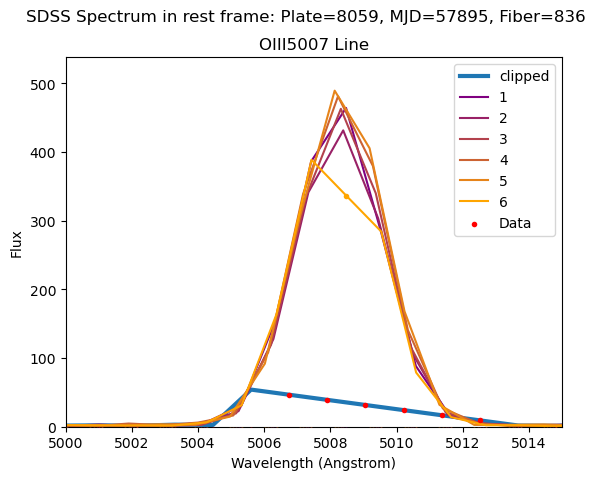

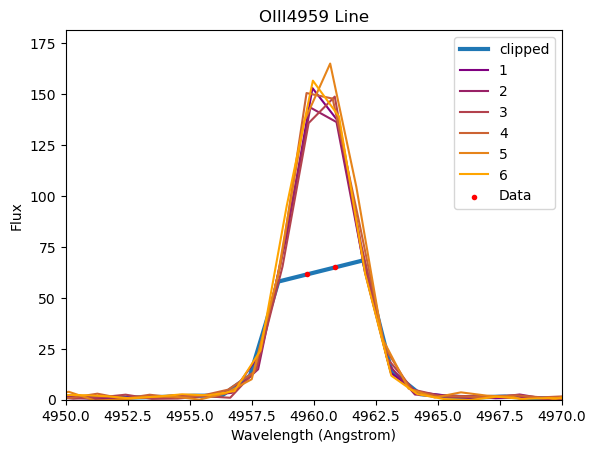

87
8213-58487-916
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


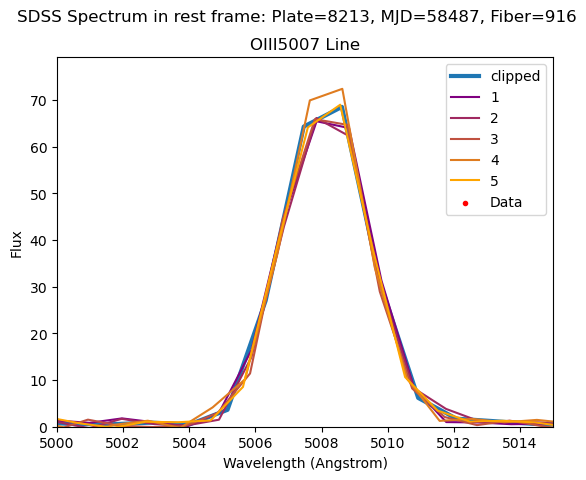

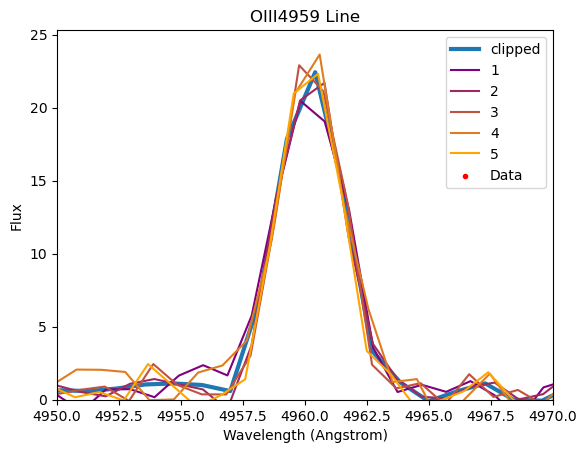

88
8221-58198-384
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


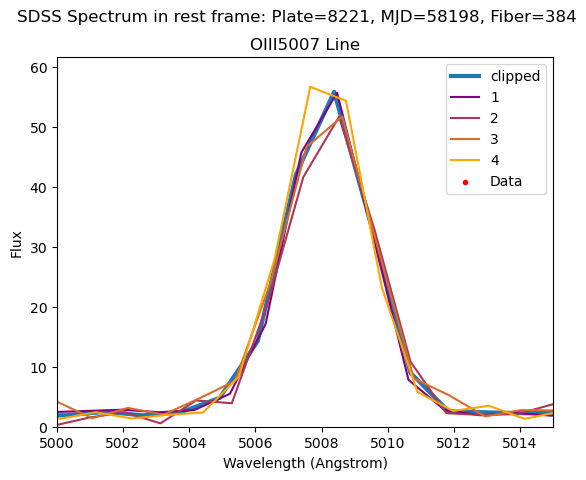

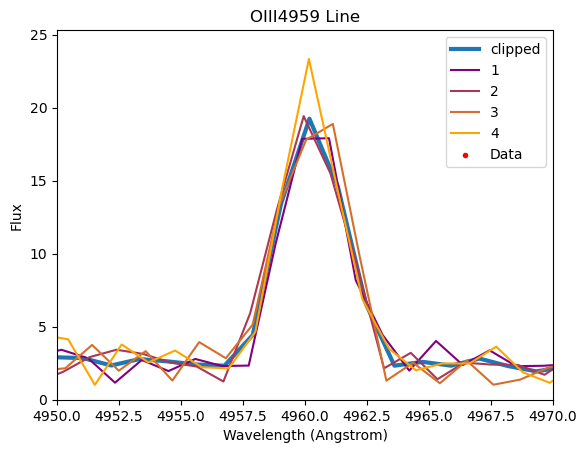

89
8236-58197-846
[1750, 1751]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


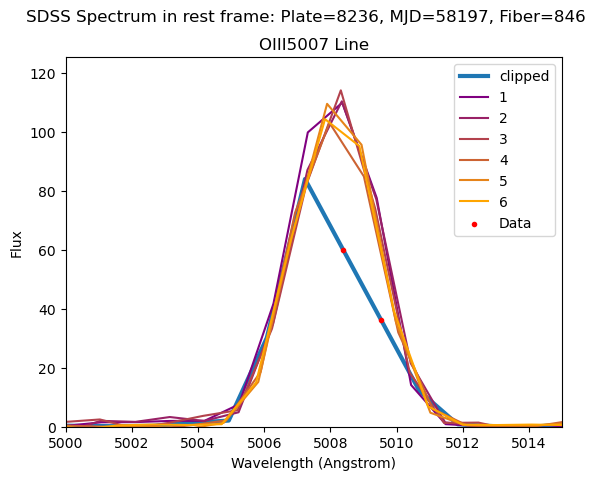

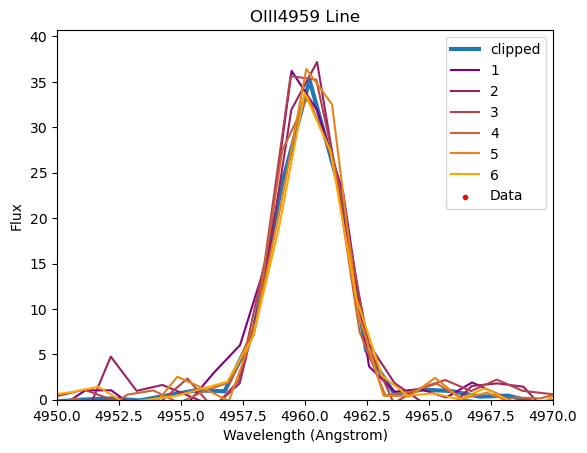

90
8236-58500-846
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


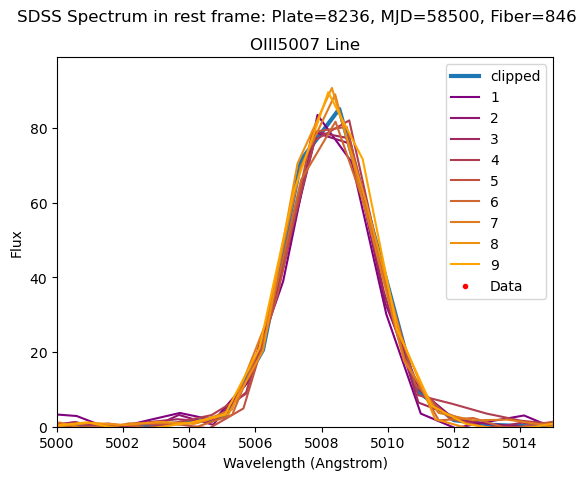

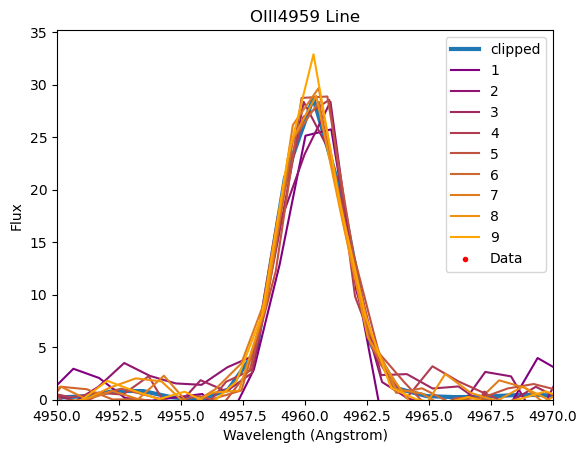

91
8396-57837-524


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[1781, 1782, 1783]


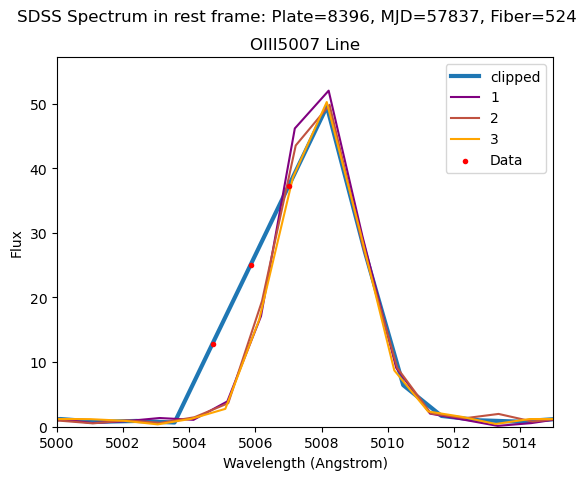

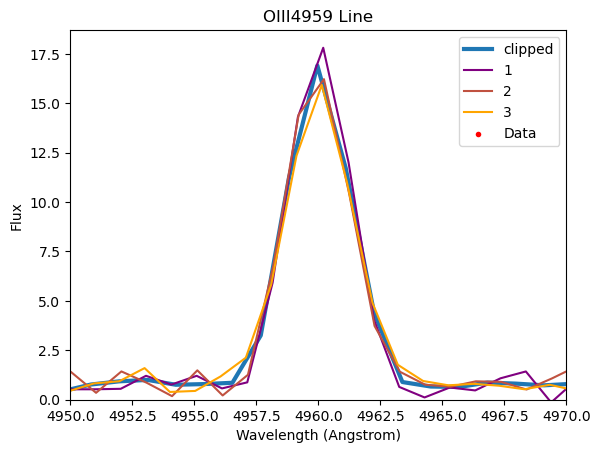

92
8845-58159-68
[1889, 1890, 1891]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


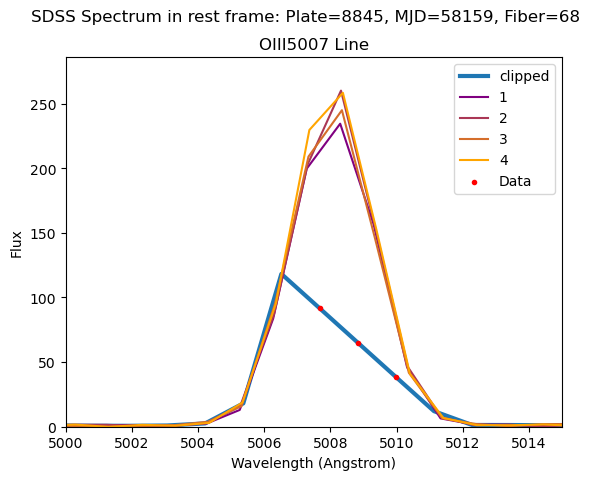

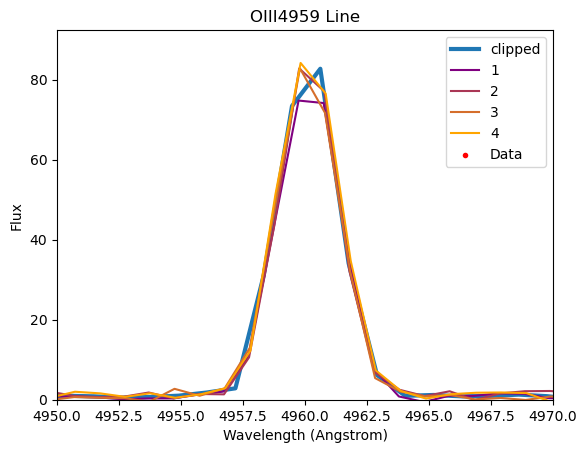

93
10261-58462-346
[]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


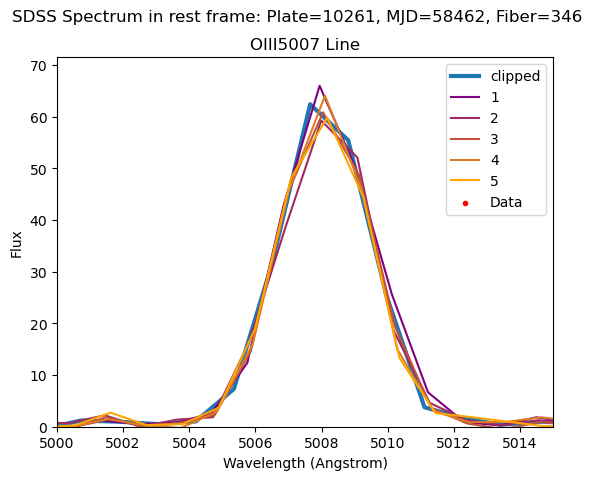

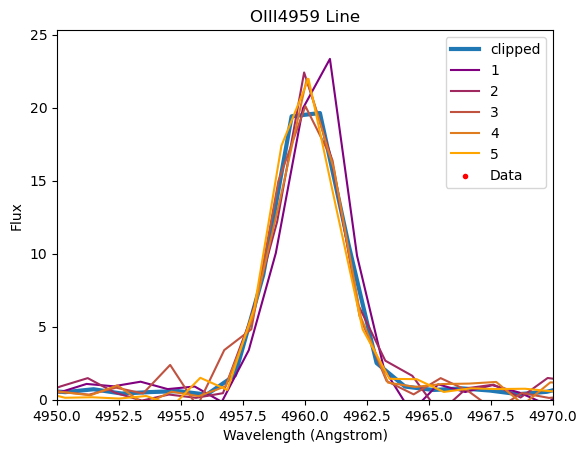

94
10664-58464-982
[1672]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


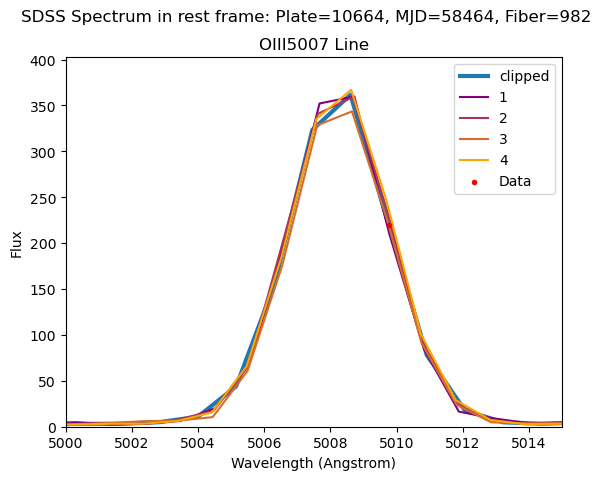

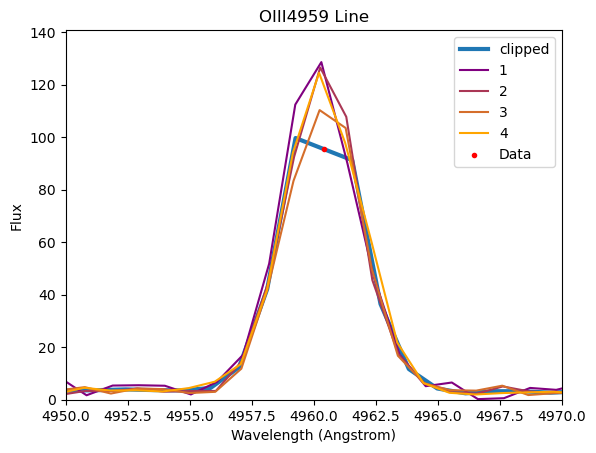

95
10724-58391-490
[1732, 1733]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


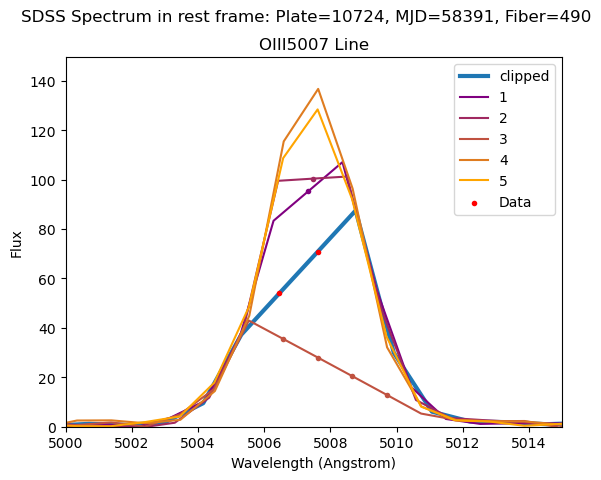

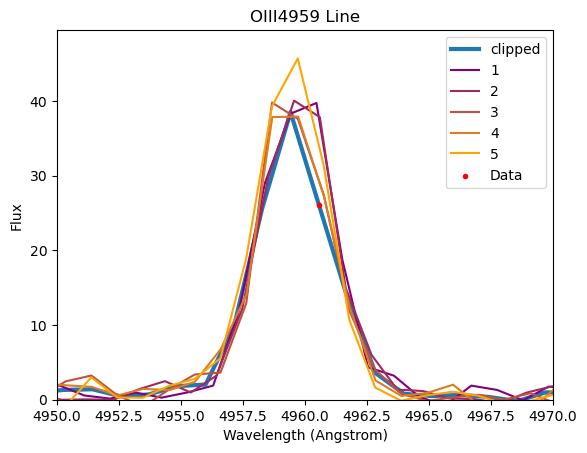

96
10742-58198-786
[1631, 1632, 1633, 1635, 1636]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


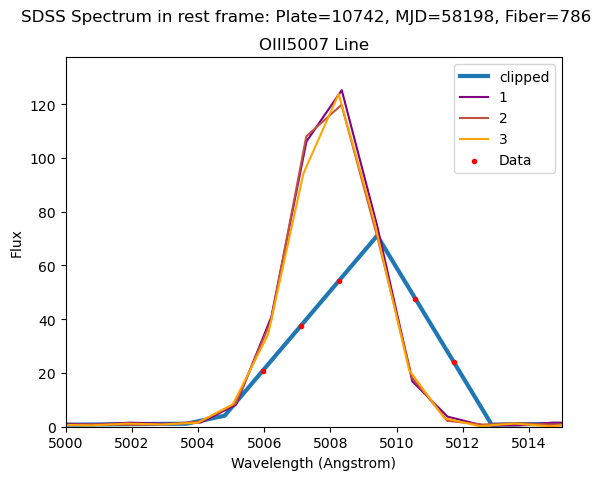

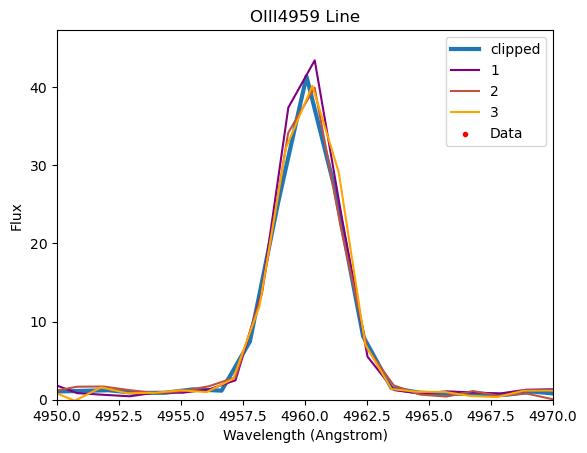

97
10756-58226-977


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


[]


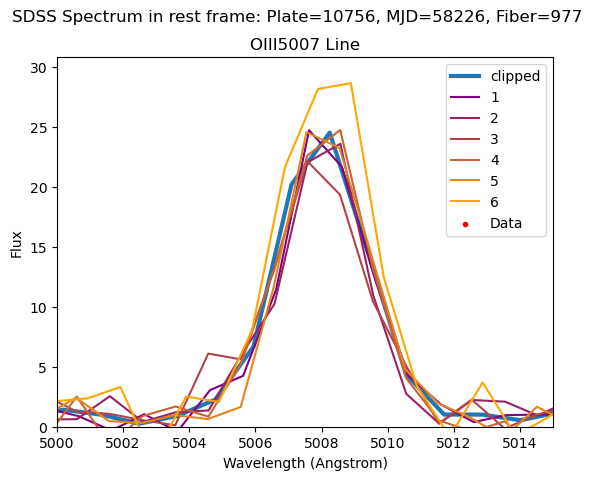

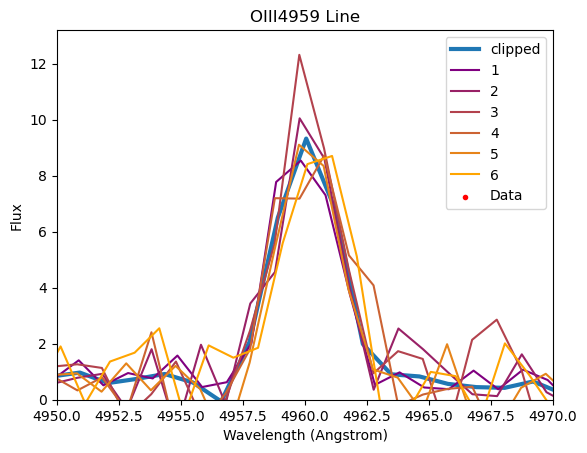

98
10911-58256-936
[1887, 1889, 1890]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


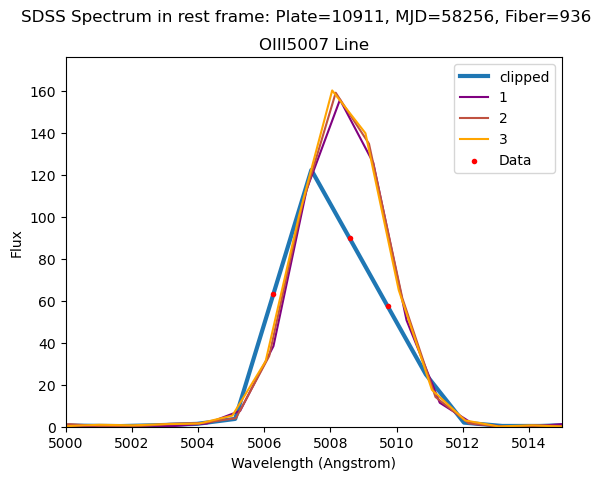

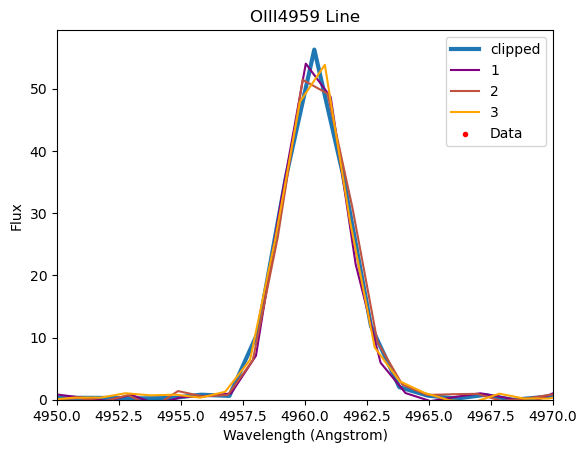

99
11112-58428-906
[1530, 1532]


C:\Users\nihad\AppData\Local\Temp\ipykernel_60288\252279934.py:23: RuntimeWarning: divide by zero encountered in divide
  uncert = 1/np.sqrt(ivar)


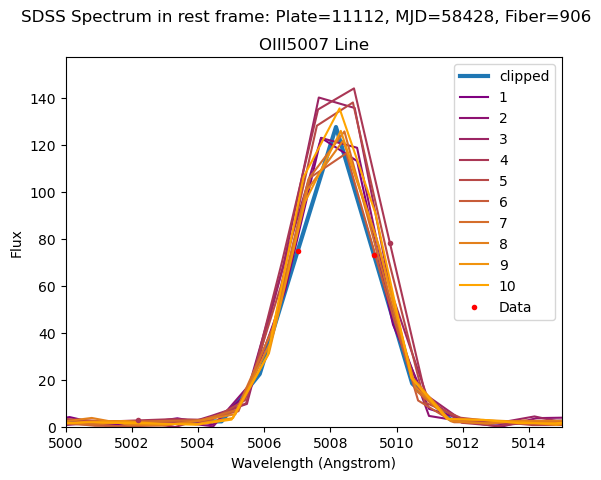

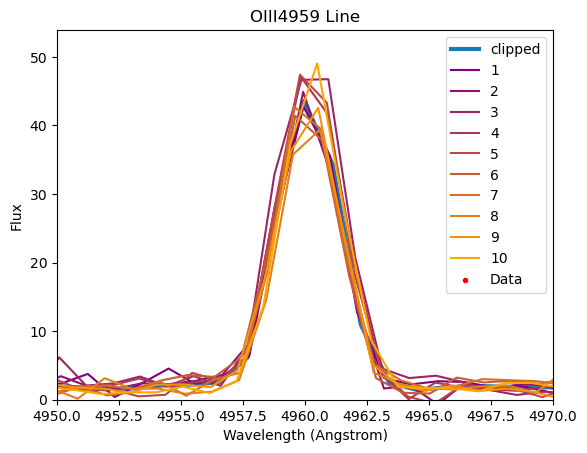

In [15]:
for i in range(100):
    print(i)
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    print(str(gal["PLATE"]) + "-" + str(gal["MJD"])+ "-"+ str(gal["FIBER"]))
    sp = SDSS.get_spectra(plate=plate, mjd=mjd, fiberID=fiber)

    spec_hdu = sp[0]
    spec_data = spec_hdu[1].data

    z = spec_hdu[2].data["z"]

    header = spec_hdu[0].header

    loglam = spec_data['loglam'].copy()
    flux = spec_data['flux'].copy()
    wavelength = 10**loglam/(1+z)
    ivar = spec_data['ivar'].copy()
    uncert = 1/np.sqrt(ivar)

    min = np.where(wavelength > 5000)[0][0]
    max = np.where(wavelength > 5015)[0][0]

    ivar0 = np.where(ivar == 0)[0]
    clipped = [item for item in ivar0 if ((item > min and item < max))]
    print(clipped)

    fig,ax = plt.subplots()
    ax.plot(wavelength, flux, lw=3, label="clipped")
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.suptitle(f"SDSS Spectrum in rest frame: Plate={plate}, MJD={mjd}, Fiber={fiber}")
    plt.title("OIII5007 Line")

    nexp = header['NEXP']
    grad = get_color_gradient("#800080","#FFA500", nexp//2)
    j = 1
    max_y_1 = []
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar']
        uncert_sub = [y if (x == 0) else -5 for x,y in zip(sub_ivar,sub_flux)]
        ax.plot(sub_wavelength, sub_flux, color = grad[sub_exp], lw=1.5, label=j)
        ax.scatter(sub_wavelength, uncert_sub, color = grad[sub_exp], linewidth=2, s = 4, zorder=3)
        min_sub = np.where(sub_wavelength > 5000)[0][0]
        max_sub = np.where(sub_wavelength > 5015)[0][0]
        max_y_1.append(sub_flux[min_sub:max_sub].max())
        j+=1

    ax.set_xlim(5000,5015)
    ax.set_ylim(0, int(np.max(max_y_1))+int(np.max(max_y_1))/10)
    uncert = [y if (x == 0) else -5 for x,y in zip(ivar,flux)]
    plt.scatter(wavelength, uncert, color = "red", linewidth=2, s = 4, label='Data', zorder=3)
    plt.legend()
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"correction_oii.png")
    plt.show()

    
    fig,ax = plt.subplots()
    ax.plot(wavelength, flux, lw=3, label="clipped")
    plt.xlabel("Wavelength (Angstrom)")
    plt.ylabel("Flux")
    plt.title("OIII4959 Line")  

    j = 1
    max_y_2 = []
    for sub_exp in range(nexp//2):
        sub_data = spec_hdu[4+sub_exp].data
        sub_flux = sub_data['flux']
        sub_wavelength = 10**sub_data['loglam'] / (1+z)
        sub_ivar = sub_data['ivar']
        uncert_sub = [y if (x == 0) else -5 for x,y in zip(sub_ivar,sub_flux)]
        ax.plot(sub_wavelength, sub_flux, lw=1.5,color=grad[sub_exp], label=j)
        ax.scatter(sub_wavelength[:len(sub_ivar)], uncert_sub, color = grad[sub_exp], linewidth=2, s = 4, zorder=3)
        min_sub = np.where(sub_wavelength > 4950)[0][0]
        max_sub = np.where(sub_wavelength > 4970)[0][0]
        max_y_2.append(sub_flux[min_sub:max_sub].max())
        j+=1

    ax.set_xlim(4950,4970)
    ax.set_ylim(0, int(np.max(max_y_2))+int(np.max(max_y_2))/10)
    plt.scatter(wavelength, uncert, color = "red", linewidth=2, s = 4, label='Data', zorder=3)
    
    plt.legend()
    plt.savefig(str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"correction_oii_4959.png")
    plt.show()

In [17]:
def merge_images(file1, file2):
    """Merge two images into one, displayed side by side
    :param file1: path to first image file
    :param file2: path to second image file
    :return: the merged Image object
    """
    image1 = Image.open(file1)
    image2 = Image.open(file2)
    (width1, height1) = image1.size
    (width2, height2) = image2.size

    result_height = height1 + height2
    print(width1, width2)
    result_width = width1

    result = Image.new('RGB', (result_width, result_height))
    result.paste(im=image1, box=(0, 0))
    result.paste(im=image2, box=(0, height1))
    return result

for i in range(100):
    num = random_galaxies[i]
    gal = cut_gals[num]

    plate = gal["PLATE"]
    mjd = gal["MJD"]
    fiber = gal["FIBER"]
    im1 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"correction_oii.png"
    im2 = str(plate) + "-" + str(mjd)+ "-"+ str(fiber)+"correction_oii_4959.png"
    merge = merge_images(im1, im2)
    merge.save(str(i)+".jpeg")

pdf = FPDF()
# imagelist is the list with all image filenames
for i in range(100):
    pdf.add_page()
    pdf.image(str(i)+".jpeg",w=pdf.epw,h=pdf.eph)
pdf.output("Clipped_OIII_analysis.pdf")

640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640
640 640


In [ ]:
#Set where ivar is 0 for individual points
#Remake the pdf
#Get rid of them and do a setup for the thing
#Tabulation of different problems with the data